In [ ]:
%load_ext autoreload
%load_ext autotime

time: 258 µs (started: 2024-12-12 19:45:40 -08:00)


In [2]:
import os
import sys
import time
import warnings
from bokeh.io import output_notebook

# Add WisIO to the path
sys.path.append(os.path.abspath("../"))

# Filter warnings
warnings.filterwarnings('ignore')

# Set the notebook to display Bokeh plots
output_notebook()

Loading BokehJS ...

time: 743 ms (started: 2024-12-12 19:45:40 -08:00)


In [3]:
analyzer = "dftracer"

run_dir = f".wisio/{analyzer}/{int(time.time())}"
bottleneck_dir = f"{run_dir}/bottlenecks"
checkpoint_dir = f"{run_dir}/checkpoints"

cluster = "external"
cluster_restart_on_connect = True
cluster_scheduler_address = "tcp://127.0.0.1:46423"

checkpoint = False
exclude_characteristics = ['node_count', 'app_count', 'proc_count', 'file_count']
logical_view_types = False
percentile = 0.95
time_granularity = 1e6
trace_path = "/p/lustre3/iopp/dftracer-traces-lfs/v1.0.5-develop/corona/cm1/APP/node-1/v1/RAW/*.pfw.gz"

app_metrics = [
    'intensity',
    'io_compute_per',
    # 'io_bw',
    # 'io_time_norm',
    # 'io_time_per',
    'ops',
    'time_norm',
    'time_per',
    # 'u_checkpoint_io_time',
    # 'u_io_time_per',
    # 'u_read_io_time',
]
dataloader_metrics = [
    'intensity',
    # 'io_bw',
    # 'io_time_norm',
    # 'io_time_per',
    'ops',
    # 'read_bw',
    'time_norm',
    'time_per',
    # 'write_bw',
]
posix_metrics = [
    'intensity',
    'data_bw',
    'data_time_norm',
    'data_time_per',
    'ops',
    # 'read_bw',
    'time_norm',
    'time_per',
    # 'write_bw',
]

app_view_types = ['proc_name', 'time_range']
dataloader_view_types = ['proc_name', 'time_range']
posix_view_types = ['proc_name', 'time_range']

time_view_type = 'time_range'
unoverlapped_posix_only = False

output_compact = False
output_group_behavior = False
output_max_bottlenecks = 1
output_root_only = True


time: 1.6 ms (started: 2024-12-12 19:45:41 -08:00)


In [5]:
# Parameters
analyzer = "dftracer"
bottleneck_dir = "/p/lustre3/iopp/wisio-bottlenecks/dftracer-bert-v100-node-4-v1-proc_name-time_range"
checkpoint = False
checkpoint_dir = "/p/lustre3/iopp/wisio-checkpoints/dftracer-bert-v100-node-4-v1-proc_name-time_range"
cluster = "external"
cluster_restart_on_connect = True
cluster_scheduler_address = "tcp://127.0.0.1:38171"
logical_view_types = False
output_max_bottlenecks = 3
output_root_only = False
percentile = 0.9
run_dir = ".wisio/dftracer-bert-v100-node-4-v1-proc_name-time_range"
time_granularity = 1000000.0
trace_path = "/p/lustre3/iopp/dftracer-traces-lfs/v1.0.5-develop/corona/bert/v100/node-4/v1/COMPACT/*.pfw.gz"

app_view_types = ["proc_name", "time_range"]
dataloader_view_types = ["proc_name", "time_range"]
posix_view_types = ["proc_name", "time_range"]


time: 1.13 ms (started: 2024-12-12 19:45:46 -08:00)


In [6]:
from distributed import Client
from hydra import compose, initialize
from hydra.core.hydra_config import HydraConfig
from hydra.utils import instantiate
from wisio.cluster import ExternalCluster
from wisio.config import init_hydra_config_store
from wisio.utils.file_utils import ensure_dir

ensure_dir(run_dir)

with initialize(version_base=None, config_path=None):
    init_hydra_config_store()
    cfg = compose(
        config_name="config",
        overrides=[
            f"+analyzer={analyzer}",
            f"analyzer.bottleneck_dir={bottleneck_dir}",
            f"analyzer.checkpoint={checkpoint}",
            f"analyzer.checkpoint_dir={checkpoint_dir}",
            f"analyzer.time_granularity={time_granularity}",
            # f"cluster={cluster}",
            # f"cluster.restart_on_connect={cluster_restart_on_connect}",
            # f"cluster.scheduler_address={cluster_scheduler_address}",
            "cluster=external",
            "cluster.scheduler_address=tcp://127.0.0.1:46065",
            f"exclude_characteristics=[{','.join(exclude_characteristics)}]",
            f"hydra.run.dir={run_dir}",
            f"hydra.runtime.output_dir={run_dir}",
            f"logical_view_types={logical_view_types}",
            f"output.compact={output_compact}",
            f"output.group_behavior={output_group_behavior}",
            f"output.max_bottlenecks={output_max_bottlenecks}",
            f"output.root_only={output_root_only}",
            f"percentile={percentile}",
            f"trace_path={trace_path}",
        ],
        return_hydra_config=True,
    )
    HydraConfig.instance().set_config(cfg)
    cluster = instantiate(cfg.cluster)
    if isinstance(cluster, ExternalCluster):
        client = Client(cluster.scheduler_address)
        if cluster.restart_on_connect:
            client.restart()
    else:
        client = Client(cluster)
    analyzer = instantiate(cfg.analyzer)
    output = instantiate(cfg.output)

time: 3.56 s (started: 2024-12-12 19:45:47 -08:00)


In [7]:
client.dashboard_link

'http://127.0.0.1:8787/status'

time: 7.41 ms (started: 2024-12-12 19:45:50 -08:00)


In [8]:
client.restart()

<Client: 'tcp://127.0.0.1:46065' processes=13 threads=13>

time: 3.25 s (started: 2024-12-12 19:45:50 -08:00)


In [ ]:
from wisio.constants import Layer

result = analyzer.analyze_trace(
    trace_path=cfg.trace_path,
    bottleneck_rules=cfg.bottleneck_rules,
    exclude_bottlenecks=cfg.exclude_bottlenecks,
    exclude_characteristics=cfg.exclude_characteristics,
    logical_view_types=cfg.logical_view_types,
    percentile=cfg.percentile,
    metrics={
        'dlio': app_metrics,
        'compute': app_metrics,
        'dataloader': dataloader_metrics,
        'image': dataloader_metrics,
        'reader': dataloader_metrics,
        'checkpoint': dataloader_metrics,
        'posix': posix_metrics,
    },
    time_view_type=time_view_type,
    unoverlapped_posix_only=unoverlapped_posix_only,
    view_types={
        'dlio': app_view_types,
        'compute': app_view_types,
        'dataloader': dataloader_view_types,
        'image': dataloader_view_types,
        'reader': dataloader_view_types,
        'checkpoint': dataloader_view_types,
        'posix': posix_view_types,
    },
)

In [9]:
traces, hlms, main_views, metric_boundaries, views, flat_views = result

time: 678 µs (started: 2024-12-12 19:29:06 -08:00)


In [11]:
checkpoint_dir

'/p/lustre3/iopp/wisio-checkpoints/dftracer-bert-v100-node-4-v1-proc_name-time_range'

time: 2.62 ms (started: 2024-12-12 19:26:50 -08:00)


In [12]:
traces.to_parquet(f"{checkpoint_dir}/_traces", write_metadata_file=True)

time: 1.69 s (started: 2024-12-12 19:26:59 -08:00)


In [10]:
metric_boundaries

{('proc_name',): 977.079794,
 ('time_range',): 982.6737220000001,
 ('proc_name', 'time_range'): 982.6737220000001,
 ('time_range', 'proc_name'): 977.079794,
 ('proc_name', 'host_name'): 976.49696,
 ('proc_name', 'proc_id'): 976.497608,
 ('proc_name', 'thread_id'): 977.079794}

time: 2.38 ms (started: 2024-12-12 19:29:10 -08:00)


In [10]:
metric_boundaries

{('proc_name',): 1947.486625,
 ('time_range',): 1953.493992,
 ('proc_name', 'time_range'): 1953.493992,
 ('time_range', 'proc_name'): 1947.486625,
 ('proc_name', 'host_name'): 1947.486625,
 ('proc_name', 'proc_id'): 1947.486625,
 ('proc_name', 'thread_id'): 1947.486625}

time: 5.94 ms (started: 2024-12-08 14:41:42 -08:00)


In [11]:
flat_views[('time_range',)][
    [
        'dlio_time',
        'compute_time',
        'dataloader_time',
        'image_time',
        'reader_time',
        'posix_time',
        'checkpoint_time',
        'u_dataloader_time',
        'u_image_time',
        'u_reader_time',
        'u_posix_time',
        'u_checkpoint_time',
    ]
].sum()

dlio_time              972.9771
compute_time         970.969485
dataloader_time        0.982446
image_time                  0.0
reader_time            0.686933
posix_time              4.74861
checkpoint_time        2.733606
u_dataloader_time      0.982446
u_image_time                0.0
u_reader_time               0.0
u_posix_time           3.681902
u_checkpoint_time      2.364693
dtype: double[pyarrow]

time: 6.65 ms (started: 2024-12-12 19:29:17 -08:00)


In [13]:
flat_views[('time_range',)][
    [
        'dlio_time',
        'compute_time',
        'dataloader_time',
        'image_time',
        'reader_time',
        'posix_time',
        'checkpoint_time',
        'u_dataloader_time',
        'u_image_time',
        'u_reader_time',
        'u_posix_time',
        'u_checkpoint_time',
    ]
].sum()

dlio_time              972.9771
compute_time         970.969485
dataloader_time        0.982446
image_time                  0.0
reader_time            0.686933
posix_time              4.74861
checkpoint_time        3.129418
u_dataloader_time      0.982446
u_image_time                0.0
u_reader_time               0.0
u_posix_time           3.681902
u_checkpoint_time      2.392216
dtype: double[pyarrow]

time: 6 ms (started: 2024-12-08 16:51:24 -08:00)


In [14]:
flat_views[('time_range',)][
    [
        'dlio_time',
        'compute_time',
        'dataloader_time',
        'image_time',
        'reader_time',
        'posix_time',
        'd_compute_time',
        'd_image_time',
        'd_reader_time',
        'd_posix_time',
    ]
]

,dlio_time,compute_time,dataloader_time,image_time,reader_time,posix_time,d_compute_time,d_image_time,d_reader_time,d_posix_time
time_range,,,,,,,,,,
0,<NA>,<NA>,<NA>,<NA>,<NA>,0.03517,0.000000,0.0,0.000000,0.035170
1,<NA>,<NA>,<NA>,<NA>,<NA>,0.013333,0.000000,0.0,0.000000,0.013333
2,<NA>,<NA>,<NA>,<NA>,<NA>,0.015456,0.000000,0.0,0.000000,0.015456
3,<NA>,<NA>,<NA>,<NA>,<NA>,0.012416,0.000000,0.0,0.000000,0.012416
4,<NA>,<NA>,<NA>,<NA>,<NA>,0.18564,0.000000,0.0,0.000000,0.185640
...,...,...,...,...,...,...,...,...,...,...
1067,0.970416,0.969041,<NA>,<NA>,0.00059,0.000008,0.000000,0.0,0.000590,0.000000
1068,<NA>,0.969046,<NA>,<NA>,0.000585,0.000006,0.969046,0.0,0.000585,0.000000
1069,<NA>,<NA>,<NA>,<NA>,<NA>,0.010863,0.000000,0.0,0.000000,0.010863


time: 17.3 ms (started: 2024-12-08 16:51:32 -08:00)


In [16]:
flat_views[('time_range',)].query('posix_compute_per > 0.1')[
    [
        'dlio_compute_util',
        'dlio_stall_time',
        'posix_time',
        'posix_compute_per',
    ]
]

,dlio_compute_util,dlio_stall_time,posix_time,posix_compute_per
time_range,,,,
98,0.593265,0.781765,0.241906,0.249632
871,0.99932,0.00066,0.487827,0.503411
922,0.999423,0.00056,0.139757,0.144223


time: 294 ms (started: 2024-12-08 17:15:28 -08:00)


In [17]:
flat_views[('time_range',)]['posix_compute_per'].describe()

count       971.0
mean     0.001129
std      0.018611
min      0.000003
25%      0.000005
50%      0.000007
75%      0.000009
max      0.503411
Name: posix_compute_per, dtype: double[pyarrow]

time: 5.26 ms (started: 2024-12-08 17:15:32 -08:00)


<Axes: xlabel='time_range'>

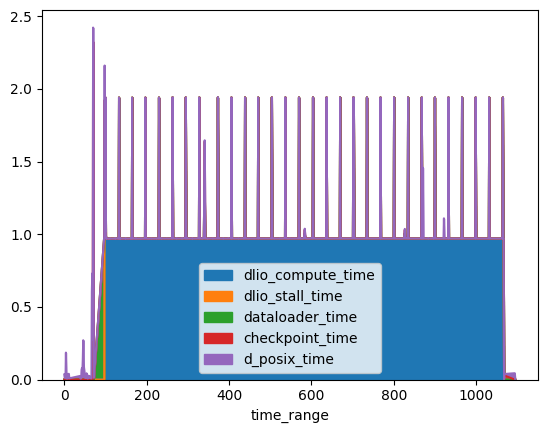

time: 951 ms (started: 2024-12-12 19:29:44 -08:00)


In [12]:
flat_views[('time_range',)][
    [
        'dlio_compute_time',
        'dlio_stall_time',
        # 'compute_time',
        'dataloader_time',
        # 'image_time',
        # 'reader_time',
        'checkpoint_time',
        'd_posix_time',
        # 'u_dataloader_time',
        # 'u_image_time',
        # 'u_reader_time',
        # 'u_posix_time',
        # 'u_checkpoint_time',
    ]
].plot(kind='area')

In [101]:
time_range_view[["dlio_time", "dataloader_time", "posix_time", "checkpoint_time"]].max().max()

2.324685

time: 4.43 ms (started: 2024-12-07 17:11:51 -08:00)


In [19]:
import math
from bokeh.palettes import Colorblind
from bokeh.models import ColumnDataSource, LinearAxis, Range1d
from bokeh.plotting import figure, show
from bokeh.io import export_svgs

time_range_view = flat_views[('time_range',)].fillna(0)
time_range_view['posix_data_bw_gb'] = time_range_view['posix_data_bw'] / 1024**3
time_range_view['posix_data_bw_gb_smooth'] = time_range_view['posix_data_bw_gb'].rolling(50).mean()

time_cols = [
    "dlio_compute_time",
    "dlio_stall_time",
    "dataloader_time",
    "checkpoint_time",
    "d_posix_time",
]

source = ColumnDataSource(time_range_view)

p = figure(
    #     x_range=list(sorted(flat_views[('time_range',)].index.astype(str))),
    height=600,
    width=1200,
    #     title="Fruit Counts by Year",
    #     toolbar_location=None,
    #     tools="hover",
    tooltips="$name @fruits: @$name",
)

p.vbar_stack(
    time_cols,
    x='time_range',
#     width=2,
    color=Colorblind[5],
    source=source,
    legend_label=[
        "Compute Time",
        "Stall Time",
        "Data Loader Time",
        "POSIX I/O Time",
        "Checkpoint Time",
    ],
)
p.y_range = Range1d(0, math.ceil(time_range_view[time_cols].max().max()))
p.yaxis.axis_label = "Time (s)"


p.extra_y_ranges['foo'] = Range1d(0, math.ceil(time_range_view['posix_data_bw_gb'].max()))
ax2 = LinearAxis(y_range_name="foo", axis_label="POSIX I/O Bandwidth")
# ax2.axis_label_text_color = "navy"
p.add_layout(ax2, 'right')
p.line(
    y="posix_data_bw_gb",
    x='time_range',
    source=source,
    color=Colorblind[6][-1],
    line_width=2,
    legend_label='POSIX I/O Bandwidth',
    y_range_name="foo",
)

p.xaxis.axis_label = 'Timeline (s)'
# p.xaxis.axis_label_standoff = 12
# p.xaxis.major_label_standoff = 12

p.y_range.start = 0
p.x_range.range_padding = 0.1
# p.xgrid.grid_line_color = None
# p.axis.minor_tick_line_color = None
# p.outline_line_color = None
p.legend.location = "top_left"
p.legend.orientation = "horizontal"

show(p)

time: 777 ms (started: 2024-12-08 17:16:26 -08:00)


In [178]:
1024 ** 3

1073741824

time: 2.28 ms (started: 2024-12-07 18:13:31 -08:00)


In [127]:
import pandas as pd
from bokeh.palettes import Vibrant
from bokeh.models import ColumnDataSource, LinearAxis, Range1d
from bokeh.plotting import figure, show

time_range_view = flat_views[('time_range',)].fillna(0)
time_range_view['posix_data_bw_gb'] = time_range_view['posix_data_bw'] / 1024**3

time_cols = [
    "dlio_compute_time",
    "dlio_stall_time",
    "dataloader_time",
    "posix_time",
    "checkpoint_time",
]
# Apply Exponential Moving Average (EMA) to smooth the line
span = 2  # Adjust the span value to control the smoothing level
time_range_view['smooth_posix_data_bw_gb'] = time_range_view['posix_data_bw_gb'].ewm(alpha=0.5).mean()

source = ColumnDataSource(time_range_view)


p = figure(
    height=600,
    width=600,
)

p.extra_y_ranges['foo'] = Range1d(0, math.ceil(time_range_view['posix_data_bw_gb'].max()))
ax2 = LinearAxis(y_range_name="foo", axis_label="POSIX I/O Bandwidth")
p.add_layout(ax2, 'right')

p.line(
    y="smooth_posix_data_bw_gb",
    x='time_range',
    source=source,
    color=Vibrant[6][-1],
    line_width=2,
    legend_label='bw',
    y_range_name="foo",
)

p.xaxis.axis_label = 'Timeline'
p.y_range.start = 0
p.x_range.range_padding = 0.1

show(p)

time: 1.03 s (started: 2024-12-07 17:23:28 -08:00)


In [146]:
import pandas as pd
from scipy.interpolate import interp1d
from bokeh.palettes import Vibrant
from bokeh.models import ColumnDataSource, LinearAxis, Range1d
from bokeh.plotting import figure, show

time_range_view = flat_views[('time_range',)].fillna(0)
time_range_view['posix_data_bw_gb'] = time_range_view['posix_data_bw'] / 1024**3

# Apply rolling window smoothing
window_size = 20
time_range_view['smooth_posix_data_bw_gb'] = time_range_view['posix_data_bw_gb'].rolling(window_size).mean()

# Create a new index for the smoothed line
new_index = pd.Index(range(len(time_range_view)), name='time_range')

# Smooth the line using interpolation
interp_func = interp1d(time_range_view.index, time_range_view['smooth_posix_data_bw_gb'], kind='linear')
smooth_posix_data_bw_gb = interp_func(new_index)

source = ColumnDataSource(time_range_view)

p = figure(
    height=600,
    width=600,
)

p.extra_y_ranges['foo'] = Range1d(0, math.ceil(time_range_view['posix_data_bw_gb'].max()))
ax2 = LinearAxis(y_range_name="foo", axis_label="POSIX I/O Bandwidth")
p.add_layout(ax2, 'right')

p.line(
    y="posix_data_bw_gb",
    x='time_range',
    source=source,
    color=Vibrant[6][-1],
    line_width=2,
    legend_label='Raw Data',
    y_range_name="foo",
)

p.line(
    y='smooth_posix_data_bw_gb',
    x='time_range',
    color="red",
    source=source,
    line_width=2,
    legend_label='Smoothed Trend',
    y_range_name="foo",
)

p.xaxis.axis_label = 'Timeline'
p.y_range.start = 0
p.x_range.range_padding = 0.1

show(p)

time: 1.09 s (started: 2024-12-07 17:33:35 -08:00)


In [19]:
traces.query('func_name == "TFReader._parse_image"').compute()[['image_id']]

,image_id
533,<NA>
535,<NA>
536,<NA>
537,<NA>
542,<NA>
...,...
9249,<NA>
9254,<NA>
9259,<NA>
9264,<NA>


time: 1.2 s (started: 2024-12-07 15:51:16 -08:00)


In [17]:
traces['func_name'].value_counts().compute()

func_name
__lxstat64                               1502944
__xstat64                                 450874
read                                       56600
close                                      44405
open                                       40372
TFReader._parse_image                      32096
TFFramework.compute                        32000
<module>.iter                              31968
<module>.yield                             31968
opendir                                    20840
__xstat                                    17088
fclose                                     16864
FileStorage.get_uri                        16096
pread                                      15692
fopen64                                    13312
readlink                                    8832
lseek64                                     5219
__fxstat64                                  4545
open64                                      4193
fopen                                       3648
write     

time: 1.08 s (started: 2024-12-07 15:49:27 -08:00)


In [13]:
flat_views[('time_range',)][
    [
        'compute_time',
        'dlio_compute_time',
        'dlio_stall_time',
        'checkpoint_time',
        'dlio_compute_util',
        'dlio_compute_util_score',
    ]
]

,compute_time,dlio_compute_time,dlio_stall_time,checkpoint_time,dlio_compute_util,dlio_compute_util_score
time_range,,,,,,
0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
1,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
2,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
3,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
4,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
...,...,...,...,...,...,...
1067,0.969041,0.970221,0.000557,<NA>,0.999426,0
1068,0.969046,<NA>,<NA>,<NA>,<NA>,<NA>
1069,<NA>,<NA>,<NA>,0.027715,<NA>,<NA>


time: 16.6 ms (started: 2024-12-12 19:29:55 -08:00)


In [12]:
flat_views[('time_range',)]['dlio_compute_util'].describe()

count       970.0
mean     0.999015
std      0.013041
min      0.593265
25%      0.999401
50%      0.999428
75%      0.999448
max           1.0
Name: dlio_compute_util, dtype: double[pyarrow]

time: 6.93 ms (started: 2024-12-07 15:47:20 -08:00)


In [12]:
from dask.distributed import wait

persisted_traces = traces.persist()
wait(persisted_traces)

DoneAndNotDoneFutures(done={<Future: finished, type: pandas.core.frame.DataFrame, key: ('assign-efdcabd24014da25668928d03a6529e0', 5)>, <Future: finished, type: pandas.core.frame.DataFrame, key: ('assign-efdcabd24014da25668928d03a6529e0', 1)>, <Future: finished, type: pandas.core.frame.DataFrame, key: ('assign-efdcabd24014da25668928d03a6529e0', 3)>, <Future: finished, type: pandas.core.frame.DataFrame, key: ('assign-efdcabd24014da25668928d03a6529e0', 2)>, <Future: finished, type: pandas.core.frame.DataFrame, key: ('assign-efdcabd24014da25668928d03a6529e0', 0)>, <Future: finished, type: pandas.core.frame.DataFrame, key: ('assign-efdcabd24014da25668928d03a6529e0', 4)>}, not_done=set())

time: 17.5 ms (started: 2024-12-01 21:44:22 -08:00)


In [12]:
posix_calls = persisted_traces.query('cat.isin(["POSIX", "STDIO"])').compute()
posix_calls

,cat,time,epoch,level,func_name,pid,step,te,tid,time_range,...,checkpoint_time,read_time,hash,value,file_name,host_name,acc_pat,count,proc_name,batch
11371,POSIX,0.000009,<NA>,1,__xstat64,1479304,<NA>,38234,1479304,0,...,<NA>,<NA>,<NA>,<NA>,/usr/lib64/flux/python3.6,corona224,0,1,app#corona224#1479304#1479304,NaN
11372,POSIX,0.000008,<NA>,1,__xstat64,1479304,<NA>,38273,1479304,0,...,<NA>,<NA>,<NA>,<NA>,/usr/lib64/flux/python3.6,corona224,0,1,app#corona224#1479304#1479304,NaN
11373,POSIX,0.000027,<NA>,1,opendir,1479304,<NA>,38313,1479304,0,...,<NA>,<NA>,<NA>,<NA>,/usr/lib64/flux/python3.6,corona224,0,1,app#corona224#1479304#1479304,NaN
11375,POSIX,0.000018,<NA>,1,__xstat64,1479304,<NA>,39922,1479304,0,...,<NA>,<NA>,<NA>,<NA>,/usr/workspace/haridev/iopp/software/scr-dlio,corona224,0,1,app#corona224#1479304#1479304,NaN
11376,POSIX,0.000024,<NA>,1,__xstat64,1479304,<NA>,39979,1479304,0,...,<NA>,<NA>,<NA>,<NA>,/usr/workspace/haridev/iopp/software/scr-dlio,corona224,0,1,app#corona224#1479304#1479304,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1484,POSIX,0.000006,<NA>,1,opendir,649972,<NA>,1095001711,649972,1095,...,<NA>,<NA>,<NA>,<NA>,/var/tmp/haridev/ompi.corona245.35619/jf.0/0,corona245,0,1,app#corona245#649972#649972,NaN
1485,POSIX,0.000006,<NA>,1,opendir,649972,<NA>,1095001727,649972,1095,...,<NA>,<NA>,<NA>,<NA>,/var/tmp/haridev/ompi.corona245.35619/jf.0,corona245,0,1,app#corona245#649972#649972,NaN
1486,POSIX,0.000006,<NA>,1,opendir,649972,<NA>,1095001741,649972,1095,...,<NA>,<NA>,<NA>,<NA>,/var/tmp/haridev/ompi.corona245.35619/jf.0,corona245,0,1,app#corona245#649972#649972,NaN
1487,POSIX,0.000006,<NA>,1,opendir,649972,<NA>,1095001755,649972,1095,...,<NA>,<NA>,<NA>,<NA>,/var/tmp/haridev/ompi.corona245.35619,corona245,0,1,app#corona245#649972#649972,NaN


time: 2.87 s (started: 2024-12-01 18:20:28 -08:00)


In [15]:
persisted_traces.query('cat.isin(["reader"])').compute()

,cat,time,epoch,level,func_name,pid,step,te,tid,time_range,...,checkpoint_time,read_time,hash,value,file_name,host_name,acc_pat,count,proc_name,batch
533,reader,0.002282,<NA>,8,TFReader._parse_image,1479304,1,98914057,1479633,98,...,<NA>,0.002282,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479633,1.0
535,reader,0.000572,<NA>,9,TFReader._parse_image,1479304,1,98915404,1479645,98,...,<NA>,0.000572,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479645,2.0
536,reader,0.000501,<NA>,9,TFReader._parse_image,1479304,1,98916377,1479633,98,...,<NA>,0.000501,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479633,3.0
537,reader,0.000714,<NA>,9,TFReader._parse_image,1479304,1,98917609,1479645,98,...,<NA>,0.000714,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479645,4.0
542,reader,0.000797,<NA>,9,TFReader._parse_image,1479304,1,100021802,1479633,100,...,<NA>,0.000797,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479633,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9249,reader,0.000488,<NA>,9,TFReader._parse_image,649972,1,1065003199,650319,1065,...,<NA>,0.000488,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#650319,NaN
9254,reader,0.000531,<NA>,9,TFReader._parse_image,649972,1,1065973744,650336,1065,...,<NA>,0.000531,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#650336,NaN
9259,reader,0.000474,<NA>,9,TFReader._parse_image,649972,1,1066944139,650319,1066,...,<NA>,0.000474,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#650319,NaN
9264,reader,0.000553,<NA>,9,TFReader._parse_image,649972,1,1067914496,650336,1067,...,<NA>,0.000553,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#650336,NaN


time: 108 ms (started: 2024-12-01 21:44:57 -08:00)


In [13]:
# time_cols = [col for col in posix_calls.columns if '_time' in col]
posix_calls.groupby(['proc_name', 'time_range'])['time'].sum().groupby(
    'time_range'
).max().sum()

4.74861

time: 276 ms (started: 2024-12-01 18:20:32 -08:00)


In [14]:
hlms['POSIX'].groupby(['proc_name', 'time_range'])['time'].sum().groupby(
    'time_range'
).max().sum().compute()

4.74861

time: 71.9 ms (started: 2024-12-01 18:20:33 -08:00)


In [15]:
compute_time_ranges = set(views['compute'][('time_range',)].index)
posix_time_ranges = set(views['POSIX'][('time_range',)].index)
remaining_posix_time_ranges = posix_time_ranges - compute_time_ranges

time: 2.03 ms (started: 2024-12-01 18:20:35 -08:00)


In [16]:
posix_calls[posix_calls['time_range'].isin(compute_time_ranges)].groupby(
    ['proc_name', 'time_range']
)['time'].sum().groupby('time_range').max().sum()

1.066708

time: 194 ms (started: 2024-12-01 18:20:36 -08:00)


In [17]:
posix_calls[posix_calls['time_range'].isin(remaining_posix_time_ranges)].groupby(
    ['proc_name', 'time_range']
)['time'].sum().groupby('time_range').max().sum()

3.681902

time: 1.11 s (started: 2024-12-01 18:20:36 -08:00)


In [10]:
len(flat_views[('time_range',)])

1022

time: 2.59 ms (started: 2024-12-01 18:22:48 -08:00)


In [14]:
flat_views[('time_range',)].sort_index().to_csv('bert_node4_time_range.csv')

time: 610 ms (started: 2024-12-12 19:30:04 -08:00)


In [15]:
flat_views[('proc_name',)].sort_index().to_csv('bert_node4_proc_name.csv')

time: 582 ms (started: 2024-12-12 19:30:04 -08:00)


In [16]:
flat_views[('proc_name', 'proc_id')].sort_index().to_csv('bert_node4_proc_id.csv')

time: 59.9 ms (started: 2024-12-12 19:30:05 -08:00)


In [17]:
flat_views[('proc_name', 'host_name')].sort_index().to_csv('bert_node4_host_name.csv')

time: 205 ms (started: 2024-12-12 19:30:05 -08:00)


In [19]:
import numpy as np
import pandas as pd

time_range_view['compute_bw'] = np.where(np.isnan, time_range_view['compute_bw'], 0)
time_range_view['compute_bw']

time_range
0          0.000000
1          0.000000
2          0.000000
3          0.000000
4          0.000000
           ...     
1067    8222.562306
1068    8255.542049
1069       0.000000
1094       0.000000
1095       0.000000
Name: compute_bw, Length: 1022, dtype: float64

time: 5.54 ms (started: 2024-12-02 00:20:15 -08:00)


In [ ]:
list(np.where(np.isnan, time_range_view['compute_bw'], 0)) #.mask(np.isnan(time_range_view['compute_bw']), 0)

In [26]:
import pandas as pd


time: 737 µs (started: 2024-12-08 17:17:19 -08:00)


<Axes: >

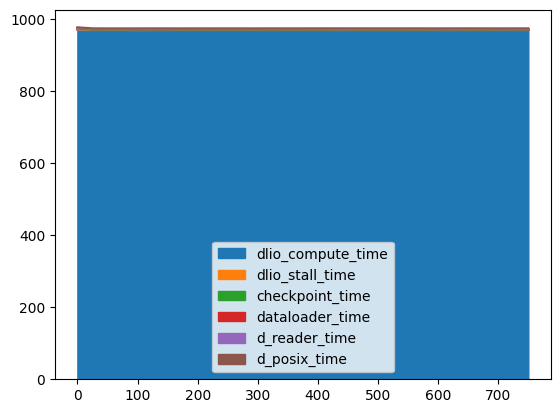

time: 445 ms (started: 2024-12-08 17:17:19 -08:00)


In [27]:
pd.read_csv('bert_node4_proc_name.csv').query('compute_time > 0').sort_index()[
    # ['dlio_compute_time', 'dlio_stall_time', 'posix_time']
    [
        # 'compute_time',
        'dlio_compute_time',
        'dlio_stall_time',
        'checkpoint_time',
        'dataloader_time',
        'd_reader_time',
        # 'dataloader_sample_time',
        'd_posix_time',
    ]
].plot(kind='area')

<Axes: >

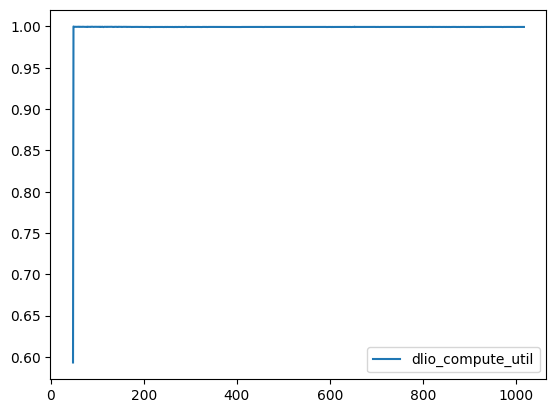

time: 250 ms (started: 2024-12-08 17:17:39 -08:00)


In [29]:
pd.read_csv('bert_node4_time_range.csv').query('compute_time > 0').sort_index()[
    # ['dlio_compute_time', 'dlio_stall_time', 'posix_time']
    [
        # 'compute_time',
        'dlio_compute_util',
        # 'dlio_stall_time',
        # 'checkpoint_time',
        # 'dataloader_time',
        # 'dataloader_sample_time',
        # 'posix_time',
    ]
].plot() #kind='bar', stacked=True)

<Axes: >

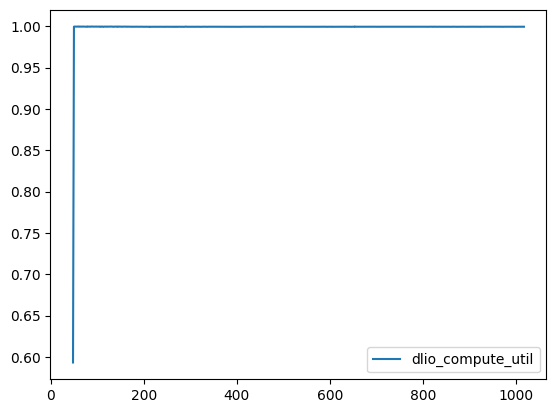

In [5]:
pd.read_csv('bert_node4_time_range.csv').query('dlio_stall_time > 0')[
    [
        # 'compute_time',
        # 'checkpoint_time',
        'dlio_compute_util',
        # 'dlio_stall_time',
        # 'dataloader_time',
        # 'dataloader_sample_time',
        # 'posix_time',
        # 'u_checkpoint_time',
        # 'u_dataloader_time',
        # 'u_dataloader_sample_time',
        # 'u_posix_time',
    ]
].plot()

In [28]:
import pandas as pd

time_range_view = pd.read_csv('bert_node4_time_range.csv').copy().set_index('time_range')
time_range_view

,checkpoint_bw,checkpoint_bw_score,checkpoint_count,checkpoint_count_per,checkpoint_count_per_score,checkpoint_intensity,checkpoint_intensity_score,checkpoint_ops,checkpoint_ops_rank,checkpoint_ops_rank_score,...,u_reader_sample_time,u_reader_sample_time_norm,u_reader_sample_time_norm_score,u_reader_sample_time_per,u_reader_sample_time_per_score,u_reader_time,u_reader_time_norm,u_reader_time_norm_score,u_reader_time_per,u_reader_time_per_score
time_range,,,,,,,,,,,,,,,,,,,,,
0,NaN,NaN,0.0,0.000000,0,0.0,0,NaN,NaN,NaN,...,0.0,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN
1,NaN,NaN,0.0,0.000000,0,0.0,0,NaN,NaN,NaN,...,0.0,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN
2,NaN,NaN,0.0,0.000000,0,0.0,0,NaN,NaN,NaN,...,0.0,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN
3,NaN,NaN,0.0,0.000000,0,0.0,0,NaN,NaN,NaN,...,0.0,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN
4,NaN,NaN,0.0,0.000000,0,0.0,0,NaN,NaN,NaN,...,0.0,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1067,NaN,NaN,0.0,0.000000,0,0.0,0,NaN,NaN,NaN,...,0.0,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN
1068,NaN,NaN,0.0,0.000000,0,0.0,0,NaN,NaN,NaN,...,0.0,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN
1069,0.0,0.0,34.0,0.167488,4,0.0,0,6.155183e+02,0.428571,5.0,...,0.0,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN


time: 72.3 ms (started: 2024-12-04 22:33:43 -08:00)


In [33]:
time_range_view.query('checkpoint_time > 0').eval('checkpoint_bw.isna() | checkpoint_bw == 0')

time_range
70      True
72      True
341     True
584     True
827     True
1069    True
1094    True
Name: checkpoint_bw, dtype: bool

time: 290 ms (started: 2024-12-04 22:35:23 -08:00)


<Axes: >

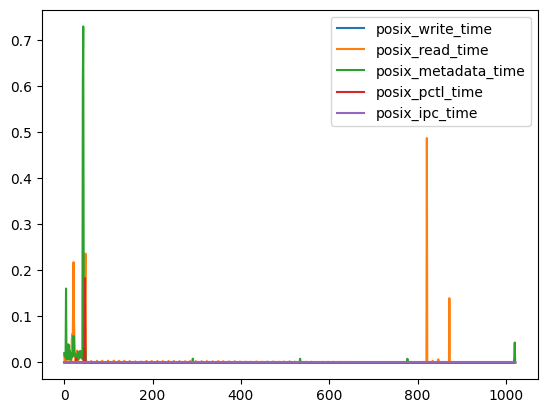

In [12]:
(
    pd.read_csv('bert_node4_time_range.csv')[
        [
            # 'compute_time',
            # 'checkpoint_time',
            # 'posix_bw',
            # 'dlio_stall_time',
            # 'dataloader_time',
            # 'dataloader_sample_time',
            # 'posix_time',
            # 'u_checkpoint_time',
            # 'u_dataloader_time',
            # 'u_dataloader_sample_time',
            # 'u_posix_time',
            'posix_write_time',
            'posix_read_time',
            'posix_metadata_time',
            'posix_pctl_time',
            'posix_ipc_time',
        ]
    ]
).plot()

In [27]:
flat_views[('time_range',)][
    [
        'compute_time',
        'checkpoint_time',
        'dlio_compute_time',
        'dlio_stall_time',
        'dataloader_time',
        'dataloader_sample_time',
        'posix_time',
        'u_checkpoint_time',
        'u_dataloader_time',
        'u_dataloader_sample_time',
        'u_posix_time',
    ]
].sum()

compute_time                970.969485
checkpoint_time                 5.4672
dlio_compute_time           972.160263
dlio_stall_time               1.331831
dataloader_time               0.982487
dataloader_sample_time             0.0
posix_time                     4.74861
u_checkpoint_time             4.729998
u_dataloader_time              0.98248
u_dataloader_sample_time           0.0
u_posix_time                  3.681902
dtype: double[pyarrow]

time: 6.07 ms (started: 2024-12-04 20:39:01 -08:00)


In [ ]:
│  App Time  Runtime: 1097.44 seconds (100%)                                                                      │
│            ├── Application I/O Time: 0.40 seconds (0.04%)                                                       │
│            ├── Checkpoint I/O Time: 0.40 seconds (0.04%)                                                        │
│            ├── Compute Time: 970.97 seconds (88.48%)                                                            │
│            ├── I/O Time: 4.75 seconds (0.43%)                                                                   │
│            ├── Read I/O Time: 0.00 seconds (0.00%)                                                              │
│            ├── Time: 1954.80 seconds (178.12%)                                                                  │
│            ├── Unoverlapped Application I/O Time: 0.03 seconds (0.00%)                                          │
│            ├── Unoverlapped Checkpoint I/O Time: 0.03 seconds (0.00%)                                           │
│            ├── Unoverlapped Compute Time: 969.90 seconds (88.38%)                                               │
│            ├── Unoverlapped I/O Time: 3.68 seconds (0.34%)                                                      │
│            ├── Unoverlapped Read I/O Time: 0.00 seconds (0.00%)                                                 │
│            └── Unoverlapped Application Compute Time: 970.60 seconds (88.44%) 

In [31]:
time_range_view = pd.read_csv('bert_node4_time_range.csv').copy()
time_range_view['x'] = 0.0
time_range_view['x'] = time_range_view['x'].mask(time_range_view.eval('dlio_compute_time > 0'), 5)
time_range_view

,time_range,checkpoint_bw,checkpoint_bw_score,checkpoint_count,checkpoint_count_per,checkpoint_count_per_score,checkpoint_intensity,checkpoint_intensity_score,checkpoint_ops,checkpoint_ops_rank,...,u_reader_sample_time_norm,u_reader_sample_time_norm_score,u_reader_sample_time_per,u_reader_sample_time_per_score,u_reader_time,u_reader_time_norm,u_reader_time_norm_score,u_reader_time_per,u_reader_time_per_score,x
0,0,NaN,NaN,0.0,0.000000,0,0.0,0,NaN,NaN,...,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN,0.0
1,1,NaN,NaN,0.0,0.000000,0,0.0,0,NaN,NaN,...,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN,0.0
2,2,NaN,NaN,0.0,0.000000,0,0.0,0,NaN,NaN,...,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN,0.0
3,3,NaN,NaN,0.0,0.000000,0,0.0,0,NaN,NaN,...,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN,0.0
4,4,NaN,NaN,0.0,0.000000,0,0.0,0,NaN,NaN,...,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1017,1067,NaN,NaN,0.0,0.000000,0,0.0,0,NaN,NaN,...,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN,5.0
1018,1068,NaN,NaN,0.0,0.000000,0,0.0,0,NaN,NaN,...,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN,0.0
1019,1069,0.0,0.0,34.0,0.167488,4,0.0,0,6.155183e+02,0.428571,...,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN,0.0
1020,1094,0.0,0.0,32.0,0.157635,4,0.0,0,2.909091e+06,0.142857,...,0.0,0,NaN,NaN,0.0,0.0,0,NaN,NaN,0.0


time: 113 ms (started: 2024-12-04 21:57:29 -08:00)


In [ ]:
import pandas as pd 
from wisio.metrics import set_metric_scores

time_range_view = pd.read_csv('bert_node4_time_range.csv').copy().set_index('time_range')
# time_range_view = pd.read_csv('cosmoflow_node4_proc_name.csv').copy().set_index('proc_name')
time_range_view.index = time_range_view.index.astype(str)

time_range_view['reader_r3_time'] = time_range_view['reader_time'].rolling(window=3).mean()
time_range_view['reader_r3_gauss_time'] = time_range_view['reader_time'].rolling(window=3, win_type='gaussian').mean(std=1)
time_range_view['reader_r3_hann_time'] = time_range_view['reader_time'].rolling(window=3, win_type='hann').mean()

time_range_view['reader_r3_time_per'] = time_range_view['reader_r3_time'] / time_range_view['reader_r3_time'].sum()
time_range_view['reader_r3_gauss_time_per'] = time_range_view['reader_r3_gauss_time'] / time_range_view['reader_r3_gauss_time'].sum()
time_range_view['reader_r3_hann_time_per'] = time_range_view['reader_r3_hann_time'] / time_range_view['reader_r3_hann_time'].sum()

time_range_view['reader_r3_2_time_per'] = time_range_view['reader_r3_time'] / time_range_view['reader_time'].sum()
time_range_view['reader_r3_2_gauss_time_per'] = time_range_view['reader_r3_gauss_time'] / time_range_view['reader_time'].sum()
time_range_view['reader_r3_2_hann_time_per'] = time_range_view['reader_r3_hann_time'] / time_range_view['reader_time'].sum()

time_range_view['reader_r3_time_norm'] = time_range_view['reader_r3_time'] / time_range_view[['dlio_time', 'dataloader_time', 'checkpoint_time', ]].sum().sum()
time_range_view['reader_r3_gauss_time_norm'] = time_range_view['reader_r3_gauss_time'] / time_range_view[['dlio_time', 'dataloader_time', 'checkpoint_time', ]].sum().sum()
time_range_view['reader_r3_hann_time_norm'] = time_range_view['reader_r3_hann_time'] / time_range_view[['dlio_time', 'dataloader_time', 'checkpoint_time', ]].sum().sum()

time_range_view['posix_read_r3_time'] = time_range_view['posix_read_time'].rolling(window=10).sum()
time_range_view['posix_read_r3_gauss_time'] = time_range_view['posix_read_time'].rolling(window=10, win_type='gaussian').sum(std=1)
time_range_view['posix_read_r3_hann_time'] = time_range_view['posix_read_time'].rolling(window=10, win_type='hann').sum()

time_range_view['posix_read_r3_time_per'] = time_range_view['posix_read_r3_time'] / time_range_view['posix_read_r3_time'].sum()
time_range_view['posix_read_r3_gauss_time_per'] = time_range_view['posix_read_r3_gauss_time'] / time_range_view['posix_read_r3_gauss_time'].sum()
time_range_view['posix_read_r3_hann_time_per'] = time_range_view['posix_read_r3_hann_time'] / time_range_view['posix_read_r3_hann_time'].sum()

time_range_view['posix_read_r3_time_norm'] = time_range_view['posix_read_r3_time'] / time_range_view[['dlio_time', 'dataloader_time', 'checkpoint_time', ]].sum().sum()
time_range_view['posix_read_r3_gauss_time_norm'] = time_range_view['posix_read_r3_gauss_time'] / time_range_view[['dlio_time', 'dataloader_time', 'checkpoint_time', ]].sum().sum()
time_range_view['posix_read_r3_hann_time_norm'] = time_range_view['posix_read_r3_hann_time'] / time_range_view[['dlio_time', 'dataloader_time', 'checkpoint_time', ]].sum().sum()

# time_range_view['dlio_compute_util'] = time_range_view['dlio_compute_time'].astype(
#     float
# ) / (
#     time_range_view['dlio_compute_time'].astype(float)
#     + time_range_view['dlio_stall_time'].astype(float)
#     # + time_range_view['checkpoint_time'].astype(float)
# )

time_range_view = set_metric_scores(time_range_view)
# time_range_view['dlio_compute_util_score'] = 8 - time_range_view['dlio_compute_util_score']
# time_range_view['dlio_compute_util_score'] = time_range_view['dlio_compute_util_score'].mask(time_range_view['dlio_compute_time'] == 0, pd.NA)

dlio_cols = ['dlio_compute_util_score'] # [col for col in time_range_view.columns if 'dlio_' in col and col.endswith('_score')]
dataloader_cols = [col for col in time_range_view.columns if 'dataloader_' in col and col.endswith('_score')]
checkpoint_cols = [col for col in time_range_view.columns if 'checkpoint_' in col and col.endswith('_score')]
posix_cols = [col for col in time_range_view.columns if 'posix_' in col and col.endswith('_score')]
# norm_cols = [col for col in time_range_view.columns if '_score' in col]
# norm_cols = ['dlio_compute_util_score'] + norm_cols
norm_cols = dlio_cols + dataloader_cols + checkpoint_cols + posix_cols

norm_cols = [col for col in norm_cols if 'slope' not in col]

norm_scores = time_range_view[norm_cols]
norm_scores

,dlio_compute_util_score,dataloader_bw_score,dataloader_compute_per_score,dataloader_count_per_score,dataloader_intensity_score,dataloader_ops_rank_score,dataloader_sample_time_norm_score,dataloader_sample_time_per_score,dataloader_time_norm_score,dataloader_time_per_score,...,u_posix_read_time_norm_score,u_posix_read_time_per_score,u_posix_seek_time_norm_score,u_posix_seek_time_per_score,u_posix_stat_time_norm_score,u_posix_stat_time_per_score,u_posix_time_norm_score,u_posix_time_per_score,u_posix_write_time_norm_score,u_posix_write_time_per_score
time_range,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,...,1,3,1,1,1,2,1,2,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,2,1,2,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,2,1,2,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,2,1,2,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,3,1,1,1,3,1,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1067,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1068,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1069,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,1,1,1,2,1,3


time: 308 ms (started: 2024-12-08 17:21:21 -08:00)


In [31]:
import pandas as pd

norm_scores_all = norm_scores.copy()
for col in norm_cols:
    norm_scores2 = norm_scores.copy()
    norm_scores2['score_col'] = col
    norm_scores2['score'] = norm_scores2[col]
    norm_scores_all = pd.concat([norm_scores_all, norm_scores2])
norm_scores_all.drop(columns=norm_cols).dropna()

,score_col,score
time_range,,
0,dlio_compute_util_score,0
1,dlio_compute_util_score,0
2,dlio_compute_util_score,0
3,dlio_compute_util_score,0
4,dlio_compute_util_score,0
...,...,...
1067,u_posix_write_time_per_score,0
1068,u_posix_write_time_per_score,0
1069,u_posix_write_time_per_score,3


time: 1.95 s (started: 2024-12-08 17:21:22 -08:00)


In [32]:
from math import pi

import pandas as pd

from bokeh.models import BasicTicker, PrintfTickFormatter
from bokeh.plotting import figure, show
from bokeh.sampledata.unemployment1948 import data
from bokeh.transform import linear_cmap
from bokeh.palettes import RdYlGn, Reds, TolYlOrBr
from bokeh.io import output_notebook

output_notebook()


VAL_COL = 'proc_id'

years = list(time_range_view.index.astype(str))
months = list(reversed(norm_cols))

# reshape to 1D array or rates with a month and year for each row.
df = norm_scores_all.drop(
    columns=norm_cols
).reset_index().dropna()  # pd.DataFrame(data.stack(), columns=['rate']).reset_index()

# this is the colormap from the original NYTimes plot
colors = [
    "#75968f",
    "#a5bab7",
    "#c9d9d3",
    "#e2e2e2",
    "#dfccce",
    "#ddb7b1",
    "#cc7878",
    "#933b41",
    "#550b1d",
]
mapper = linear_cmap(
    field_name="score",
    palette=Reds[8][::-1],  # Green-to-Red palette with 11 steps
    low=0,
    high=8,
)

TOOLS = "hover,save,pan,box_zoom,reset,wheel_zoom"

p = figure(
    # title=f"US Unemployment ({years[0]} - {years[-1]})",
    x_range=years,
    y_range=months,
    x_axis_location="above",
    width=900,
    height=400,
    tools=TOOLS,
    toolbar_location='below',
    tooltips=[('date', '@time_range'), ('score', '@score%')],
)

p.grid.grid_line_color = None
p.axis.axis_line_color = None
p.axis.major_tick_line_color = None
p.axis.major_label_text_font_size = "7px"
p.axis.major_label_standoff = 0
p.xaxis.major_label_orientation = pi / 3

r = p.rect(
    x="time_range",
    y="score_col",
    width=1,
    height=1,
    source=df,
    fill_color=mapper, # linear_cmap("score", colors, low=0, high=8),
    line_color=None,
)

p.add_layout(
    r.construct_color_bar(
        major_label_text_font_size="7px",
        ticker=BasicTicker(desired_num_ticks=len(colors)),
        formatter=PrintfTickFormatter(format="%d%%"),
        label_standoff=6,
        border_line_color=None,
        padding=5,
    ),
    'right',
)

show(p)

Loading BokehJS ...

time: 754 ms (started: 2024-12-08 17:21:24 -08:00)


Feature Importances (Random Forest):
posix_open_count_per_score     0.191098
posix_seek_ops_rank_score      0.182570
compute_intensity_score        0.146987
posix_compute_per_score        0.129827
posix_read_time_per_score      0.112682
                                 ...   
posix_count_per_score          0.000000
posix_close_time_norm_score    0.000000
posix_close_ops_rank_score     0.000000
posix_close_count_per_score    0.000000
u_reader_time_per_score        0.000000
Length: 145, dtype: float64


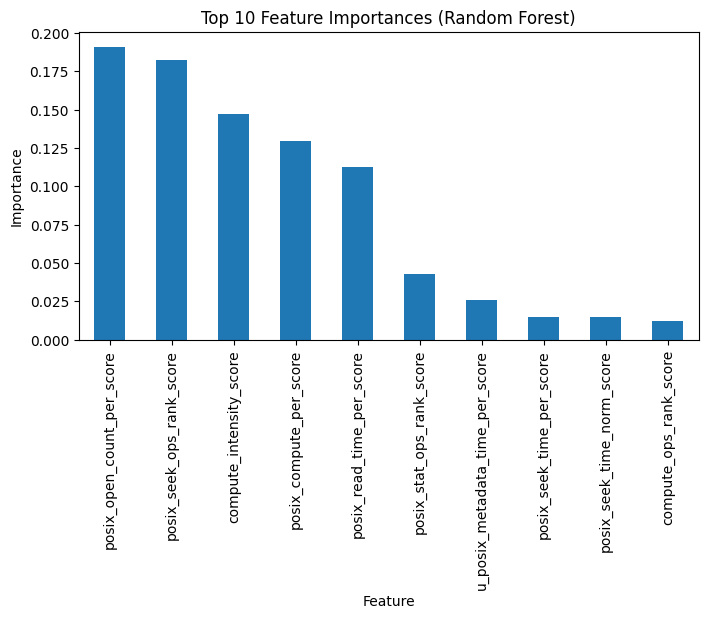

time: 349 ms (started: 2024-12-08 18:58:30 -08:00)


In [51]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import pandas as pd

# Splitting data into features (X) and target (y)
# df = df.dropna()
df = pd.read_csv('bert_node4_time_range.csv').copy().set_index('time_range')
target = 'dlio_compute_util_score'
# target = 'dlio_stall_time_per_score'
score_cols = [col for col in df.columns if '_score' in col and 'dlio' not in col and 'slope' not in col and 'posix_data' not in col]
score_cols = score_cols + [target]
X = df[score_cols].drop(columns=[target])  # All columns except the target
y = df[target]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest Regressor
rf = RandomForestRegressor(random_state=42)
rf.fit(X_train, y_train)

# Extract feature importances
feature_importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)

# Display top features
print("Feature Importances (Random Forest):")
print(feature_importances)

# Plot feature importances
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))
feature_importances.head(10).plot(kind='bar')
plt.title('Top 10 Feature Importances (Random Forest)')
plt.ylabel('Importance')
plt.xlabel('Feature')
plt.show()


Top correlations with 'dlio_compute_util_score':
dlio_compute_util_score               1.000000
posix_open_count_per_score            0.299617
posix_seek_ops_rank_score             0.291157
posix_compute_per_score               0.236546
posix_close_count_per_score           0.228830
                                        ...   
u_reader_preprocess_time_per_score         NaN
u_reader_sample_time_norm_score            NaN
u_reader_sample_time_per_score             NaN
u_reader_time_norm_score                   NaN
u_reader_time_per_score                    NaN
Name: dlio_compute_util_score, Length: 146, dtype: float64


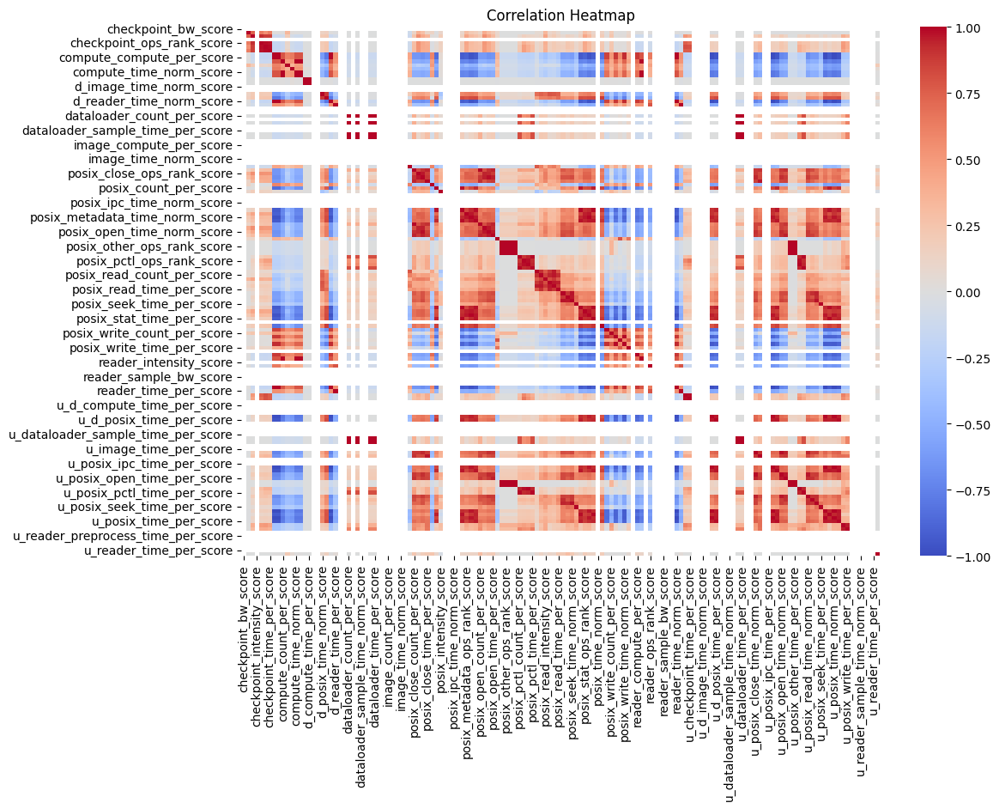

time: 859 ms (started: 2024-12-08 18:58:07 -08:00)


In [48]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming `df` is your dataframe containing the scores

df = pd.read_csv('bert_node4_time_range.csv').copy().set_index('time_range')
target = 'dlio_compute_util_score'
# target = 'dlio_stall_time_per_score'
score_cols = [col for col in df.columns if '_score' in col and 'dlio' not in col and 'slope' not in col and 'posix_data' not in col]
score_cols = score_cols + [target]
X = df[score_cols].drop(columns=[target])  # All columns except the target
y = df[target]


# df = norm_scores.copy()

# Calculate correlation matrix
correlation_matrix = df[score_cols].copy().corr()

# Focus on correlations with 'dlio_compute_util_score'
target_correlation = correlation_matrix[target].sort_values(ascending=False)

# Print correlations
print("Top correlations with 'dlio_compute_util_score':")
print(target_correlation)

# Plot a heatmap for visualization
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', center=0, cbar=True)
plt.title('Correlation Heatmap')
plt.show()

# Optional: Heatmap focusing only on top 10 correlated features
# top_features = target_correlation.index[:10]  # Top 10 features
# plt.figure(figsize=(10, 6))
# sns.heatmap(df[top_features].corr(), annot=True, cmap='coolwarm', center=0, cbar=True)
# plt.title('Heatmap of Top 10 Correlated Features with dlio_compute_util_score')
# plt.show()


Feature Importances (Random Forest):
checkpoint_bw_score                  0.0
reader_time_norm_score               0.0
reader_intensity_score               0.0
reader_ops_rank_score                0.0
reader_preprocess_time_norm_score    0.0
                                    ... 
posix_ipc_count_per_score            0.0
posix_ipc_ops_rank_score             0.0
posix_ipc_time_norm_score            0.0
posix_ipc_time_per_score             0.0
u_reader_time_per_score              0.0
Length: 153, dtype: float64


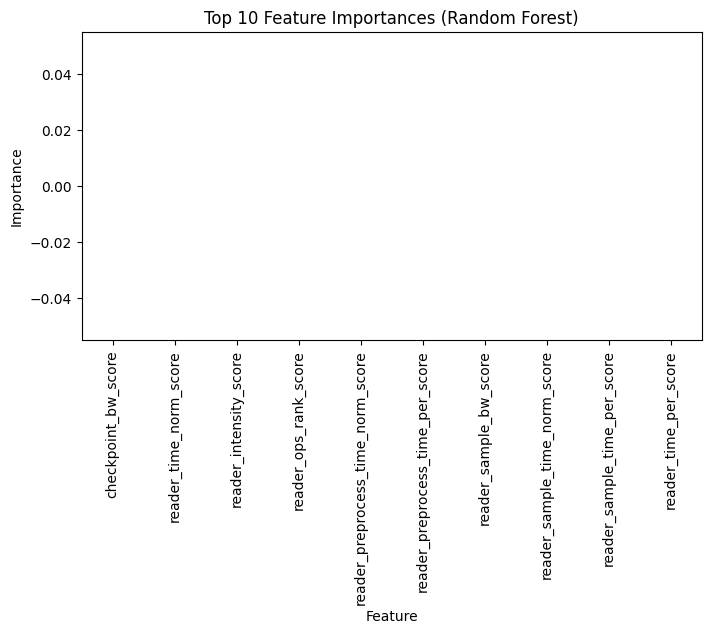

time: 303 ms (started: 2024-12-08 17:56:49 -08:00)


In [47]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import pandas as pd

# Splitting data into features (X) and target (y)
# df = df.dropna()
df = pd.read_csv('bert_node4_proc_name.csv').copy().set_index('proc_name')
target = 'dlio_compute_util_score'
# target = 'dlio_stall_time_per_score'
score_cols = [col for col in df.columns if '_score' in col and 'dlio' not in col and 'slope' not in col]
score_cols = score_cols + [target]
X = df[score_cols].drop(columns=[target])  # All columns except the target
y = df[target]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest Regressor
rf = RandomForestRegressor(random_state=42)
rf.fit(X_train, y_train)

# Extract feature importances
feature_importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)

# Display top features
print("Feature Importances (Random Forest):")
print(feature_importances)

# Plot feature importances
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))
feature_importances.head(10).plot(kind='bar')
plt.title('Top 10 Feature Importances (Random Forest)')
plt.ylabel('Importance')
plt.xlabel('Feature')
plt.show()


Top correlations with 'dlio_compute_util_score':
checkpoint_bw_score               NaN
checkpoint_compute_per_score      NaN
checkpoint_count_per_score        NaN
checkpoint_intensity_score        NaN
checkpoint_ops_rank_score         NaN
                                   ..
u_reader_sample_time_norm_score   NaN
u_reader_sample_time_per_score    NaN
u_reader_time_norm_score          NaN
u_reader_time_per_score           NaN
dlio_compute_util_score           NaN
Name: dlio_compute_util_score, Length: 154, dtype: float64


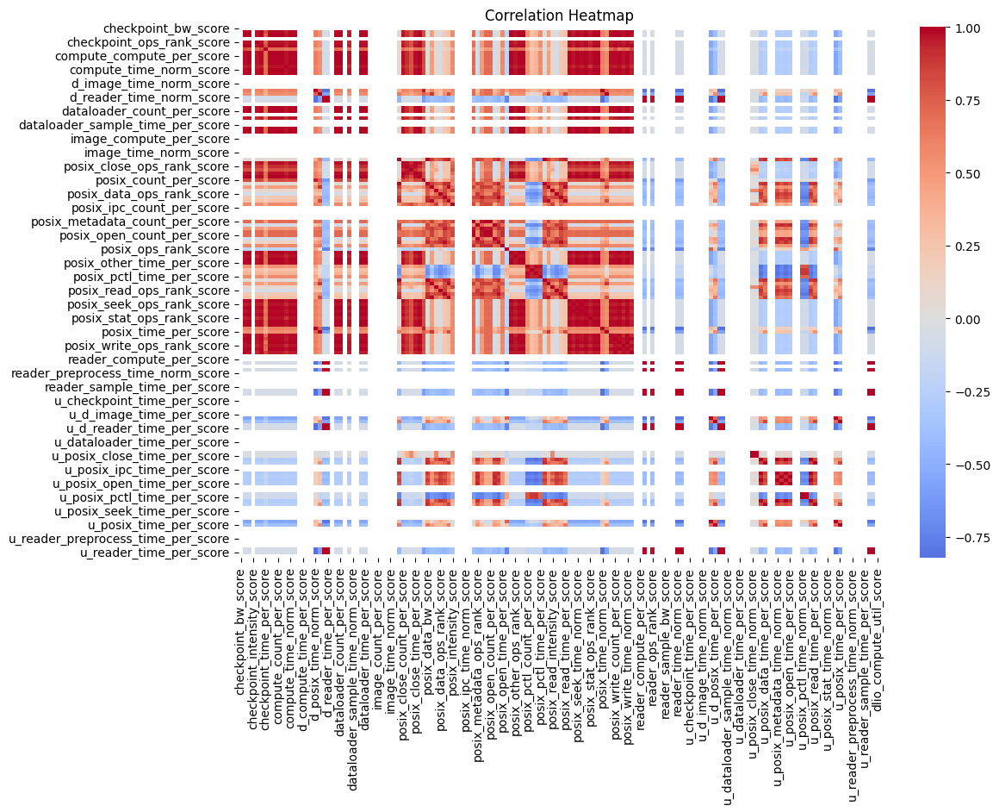

time: 881 ms (started: 2024-12-08 17:56:19 -08:00)


In [46]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming `df` is your dataframe containing the scores

df = pd.read_csv('bert_node4_proc_name.csv').copy().set_index('proc_name')
target = 'dlio_compute_util_score'
# target = 'dlio_stall_time_per_score'
score_cols = [col for col in df.columns if '_score' in col and 'dlio' not in col and 'slope' not in col]
score_cols = score_cols + [target]
X = df[score_cols].drop(columns=[target])  # All columns except the target
y = df[target]


# df = norm_scores.copy()

# Calculate correlation matrix
correlation_matrix = df[score_cols].copy().corr()

# Focus on correlations with 'dlio_compute_util_score'
target_correlation = correlation_matrix[target].sort_values(ascending=False)

# Print correlations
print("Top correlations with 'dlio_compute_util_score':")
print(target_correlation)

# Plot a heatmap for visualization
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', center=0, cbar=True)
plt.title('Correlation Heatmap')
plt.show()

# Optional: Heatmap focusing only on top 10 correlated features
# top_features = target_correlation.index[:10]  # Top 10 features
# plt.figure(figsize=(10, 6))
# sns.heatmap(df[top_features].corr(), annot=True, cmap='coolwarm', center=0, cbar=True)
# plt.title('Heatmap of Top 10 Correlated Features with dlio_compute_util_score')
# plt.show()


In [22]:
len(views['POSIX'][('time_range',)])

1022

time: 171 ms (started: 2024-12-01 15:08:10 -08:00)


In [11]:
persisted_traces['cat'].value_counts().compute()

cat
POSIX             2175579
dlio_benchmark      63936
STDIO               34048
reader              32096
ai_framework        32000
storage             16288
config                256
checkpoint            203
dftracer              194
data_loader           160
Name: count, dtype: int64[pyarrow]

time: 31.3 ms (started: 2024-12-01 13:45:46 -08:00)


In [12]:
persisted_traces.query('cat == "dlio_benchmark"')['func_name'].value_counts().compute()

func_name
<module>.iter     31968
<module>.yield    31968
Name: count, dtype: int64[pyarrow]

time: 64.3 ms (started: 2024-12-01 13:45:46 -08:00)


In [13]:
persisted_traces.query('cat == "ai_framework"')['func_name'].value_counts().compute()

func_name
TFFramework.compute    32000
Name: count, dtype: int64[pyarrow]

time: 62.8 ms (started: 2024-12-01 13:45:46 -08:00)


In [14]:
persisted_traces.query('cat == "data_loader"')['func_name'].value_counts().compute()

func_name
TFDataLoader.__init__    64
TFDataLoader.finalize    32
TFDataLoader.next        32
TFDataLoader.read        32
Name: count, dtype: int64[pyarrow]

time: 59.3 ms (started: 2024-12-01 13:45:46 -08:00)


In [15]:
persisted_traces.query('cat == "reader"')['func_name'].value_counts().compute()

func_name
TFReader._parse_image    32096
Name: count, dtype: int64[pyarrow]

time: 63.4 ms (started: 2024-12-01 13:45:46 -08:00)


In [16]:
persisted_traces.query('cat == "checkpoint"')['func_name'].value_counts().compute()

func_name
TFCheckpointing.checkpoint    128
TFCheckpointing.__init__       32
TFCheckpointing.finalize       32
TFCheckpointing.save_state      8
TFCheckpointing.get_tensor      3
Name: count, dtype: int64[pyarrow]

time: 59.7 ms (started: 2024-12-01 13:45:46 -08:00)


In [17]:
persisted_traces.query('cat == "storage"')['func_name'].value_counts().compute()

func_name
FileStorage.get_uri             16096
FileStorage.__init__               64
FileStorage.walk_node              64
FileStorage.create_namespace       32
FileStorage.get_node               32
Name: count, dtype: int64[pyarrow]

time: 63.4 ms (started: 2024-12-01 13:45:46 -08:00)


In [18]:
persisted_traces.query('cat == "POSIX"')['func_name'].value_counts().compute()

func_name
__lxstat64    1502944
__xstat64      450874
read            56600
close           44405
open            40372
opendir         20840
__xstat         17088
pread           15692
readlink         8832
lseek64          5219
__fxstat64       4545
open64           4193
write            2029
__fxstat          576
access            376
fork              320
unlink            200
mkdir             166
mmap              128
fcntl              64
rename             64
rmdir              52
Name: count, dtype: int64[pyarrow]

time: 170 ms (started: 2024-12-01 13:45:46 -08:00)


In [19]:
persisted_traces.query('cat == "ai_framework"').compute()

,cat,time,epoch,level,func_name,pid,step,te,tid,time_range,...,checkpoint_time,read_time,hash,value,file_name,host_name,acc_pat,count,proc_name,batch
538,ai_framework,0.968921,<NA>,8,TFFramework.compute,1479304,<NA>,99883628,1479304,98,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,NaN
543,ai_framework,0.968821,<NA>,8,TFFramework.compute,1479304,<NA>,100986843,1479304,100,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,NaN
548,ai_framework,0.968914,<NA>,8,TFFramework.compute,1479304,<NA>,101956882,1479304,100,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,NaN
553,ai_framework,0.968826,<NA>,8,TFFramework.compute,1479304,<NA>,102926633,1479304,101,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,NaN
558,ai_framework,0.968989,<NA>,8,TFFramework.compute,1479304,<NA>,103896793,1479304,102,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9250,ai_framework,0.968977,<NA>,8,TFFramework.compute,649972,<NA>,1065971587,649972,1065,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#649972,NaN
9255,ai_framework,0.968984,<NA>,8,TFFramework.compute,649972,<NA>,1066942118,649972,1065,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#649972,NaN
9260,ai_framework,0.968977,<NA>,8,TFFramework.compute,649972,<NA>,1067912472,649972,1066,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#649972,NaN
9265,ai_framework,0.968979,<NA>,8,TFFramework.compute,649972,<NA>,1068882837,649972,1067,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#649972,NaN


time: 116 ms (started: 2024-12-01 13:45:46 -08:00)


In [20]:
hlms['dlio'].compute()

,time_range,func_name,io_cat,acc_pat,proc_name,cat,time,count,size_min,size_max,size
6,98,<module>.yield,6,0,app#corona224#1479304#1479304,dlio_benchmark,1.102931,1,<NA>,<NA>,0
9,101,<module>.yield,6,0,app#corona224#1479304#1479304,dlio_benchmark,0.96962,1,<NA>,<NA>,0
13,104,<module>.iter,6,0,app#corona224#1479304#1479304,dlio_benchmark,0.000216,1,<NA>,<NA>,0
14,104,<module>.yield,6,0,app#corona224#1479304#1479304,dlio_benchmark,0.96955,1,<NA>,<NA>,0
16,105,<module>.yield,6,0,app#corona224#1479304#1479304,dlio_benchmark,0.969629,1,<NA>,<NA>,0
...,...,...,...,...,...,...,...,...,...,...,...
49445,1060,<module>.yield,6,0,app#corona245#649972#649972,dlio_benchmark,0.970237,1,<NA>,<NA>,0
49446,1061,<module>.iter,6,0,app#corona245#649972#649972,dlio_benchmark,0.000221,1,<NA>,<NA>,0
49450,1064,<module>.iter,6,0,app#corona245#649972#649972,dlio_benchmark,0.000215,1,<NA>,<NA>,0
49451,1064,<module>.yield,6,0,app#corona245#649972#649972,dlio_benchmark,0.970026,1,<NA>,<NA>,0


time: 67.7 ms (started: 2024-12-01 13:45:47 -08:00)


In [21]:
hlms['compute'].compute()

,time_range,func_name,io_cat,acc_pat,proc_name,cat,time,count,size_min,size_max,size
8,100,TFFramework.compute,6,0,app#corona224#1479304#1479304,ai_framework,1.937735,2,2,3,5
11,102,TFFramework.compute,6,0,app#corona224#1479304#1479304,ai_framework,0.968989,1,5,5,5
12,104,TFFramework.compute,6,0,app#corona224#1479304#1479304,ai_framework,0.968921,1,7,7,7
15,105,TFFramework.compute,6,0,app#corona224#1479304#1479304,ai_framework,0.968812,1,8,8,8
18,109,TFFramework.compute,6,0,app#corona224#1479304#1479304,ai_framework,0.968822,1,12,12,12
...,...,...,...,...,...,...,...,...,...,...,...
49435,1053,TFFramework.compute,6,0,app#corona245#649972#649972,ai_framework,0.968975,1,234,234,234
49437,1055,TFFramework.compute,6,0,app#corona245#649972#649972,ai_framework,0.968983,1,236,236,236
49440,1057,TFFramework.compute,6,0,app#corona245#649972#649972,ai_framework,0.968978,1,238,238,238
49443,1058,TFFramework.compute,6,0,app#corona245#649972#649972,ai_framework,0.968986,1,239,239,239


time: 46.3 ms (started: 2024-12-01 13:45:47 -08:00)


In [24]:
time_range_view = flat_views[('time_range',)].compute()
time_range_view

,compute_bw,compute_count,compute_count_per,compute_intensity,compute_intensity_rank,compute_ops,compute_ops_rank,compute_ops_slope,compute_size,compute_size_max,...,u_posix_seek_time,u_posix_seek_time_per,u_posix_stat_time,u_posix_stat_time_per,u_posix_time,u_posix_time_per,u_posix_write_time,u_posix_write_time_per,u_reader_time,u_reader_time_per
time_range,,,,,,,,,,,,,,,,,,,,,
98,28.894308,28,0.000876,1.000000,0.997938,28.894308,323.333333,0.876736,28,1,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
100,82.559382,64,0.002002,0.400000,0.991753,33.023753,1.054921,1.002035,160,3,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
101,132.093171,32,0.001001,0.250000,0.986082,33.023293,1.160287,1.002021,128,4,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
102,165.116805,32,0.001001,0.200000,0.981959,33.023361,1.146572,1.002023,160,5,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
103,198.142415,32,0.001001,0.166667,0.977835,33.023736,1.061269,1.002034,192,6,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1064,8090.589839,32,0.001001,0.004082,0.021134,33.022816,1.488872,1.002007,7840,245,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
1065,8140.04426,64,0.002002,0.004057,0.015464,33.022492,3.514493,1.001997,15776,247,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
1066,8189.447006,32,0.001001,0.004032,0.009794,33.021964,18.47619,1.001981,7936,248,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN


time: 383 ms (started: 2024-12-01 13:46:09 -08:00)


In [46]:
time_range_view.query('compute_time > 0')[['dlio_time', 'dlio_compute_time', 'dlio_stall_time', 'dlio_compute_util', 'compute_time', 'dataloader_sample_time', 'reader_time', 'posix_time', 'u_posix_time']]

,dlio_time,dlio_compute_time,dlio_stall_time,dlio_compute_util,compute_time,dataloader_sample_time,reader_time,posix_time,u_posix_time
time_range,,,,,,,,,
98,1.751551,1.140286,0.781765,0.593265,0.969049,0.0,0.003256,0.241906,0.0
100,1.939849,1.939354,0.000879,0.999547,1.937999,<NA>,0.001449,0.003375,0.0
101,0.969865,0.96966,0.000407,0.99958,0.969013,<NA>,0.001032,0.00001,0.0
102,0.979254,0.979047,0.000428,0.999563,0.969011,<NA>,0.00065,0.000007,0.0
103,0.969775,0.969568,0.00026,0.999732,0.969,<NA>,0.000781,0.000007,0.0
...,...,...,...,...,...,...,...,...,...
1064,0.9703,0.970089,0.000555,0.999428,0.969027,<NA>,0.000736,0.000004,0.0
1065,1.940859,1.94045,0.001183,0.999391,1.938073,<NA>,0.001096,0.000024,0.0
1066,0.970293,0.970096,0.000527,0.999457,0.969052,<NA>,0.000686,0.000005,0.0


time: 90.2 ms (started: 2024-12-01 14:03:32 -08:00)


In [35]:
time_range_view.query('u_posix_time > 0')

,compute_bw,compute_count,compute_count_per,compute_intensity,compute_intensity_rank,compute_ops,compute_ops_rank,compute_ops_slope,compute_size,compute_size_max,...,u_posix_seek_time,u_posix_seek_time_per,u_posix_stat_time,u_posix_stat_time_per,u_posix_time,u_posix_time_per,u_posix_write_time,u_posix_write_time_per,u_reader_time,u_reader_time_per
time_range,,,,,,,,,,,,,,,,,,,,,


time: 82.6 ms (started: 2024-12-01 13:56:02 -08:00)


In [28]:
time_range_view.to_csv('bert_tr.csv')

time: 130 ms (started: 2024-11-30 16:19:41 -08:00)


In [32]:
proc_name_view = flat_views[('proc_name',)].compute()
proc_name_view

,compute_bw,compute_count,compute_count_per,compute_intensity,compute_intensity_rank,compute_ops,compute_ops_rank,compute_ops_slope,compute_size,compute_size_max,...,u_posix_seek_time,u_posix_seek_time_per,u_posix_stat_time,u_posix_stat_time_per,u_posix_time,u_posix_time_per,u_posix_write_time,u_posix_write_time_per,u_reader_time,u_reader_time_per
proc_name,,,,,,,,,,,,,,,,,,,,,
app#corona197#473875#473875,129.517129,1000,0.03125,0.007968,0.515625,1.032009,1.882353,0.999969,125500,250,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,<NA>,<NA>
app#corona197#473876#473876,129.517015,1000,0.03125,0.007968,0.515625,1.032008,4.0,0.999968,125500,250,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,<NA>,<NA>
app#corona197#473877#473877,129.516546,1000,0.03125,0.007968,0.515625,1.032004,16.0,0.999964,125500,250,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,<NA>,<NA>
app#corona197#473878#473878,129.51711,1000,0.03125,0.007968,0.515625,1.032009,2.064516,0.999969,125500,250,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,<NA>,<NA>
app#corona197#473879#473879,129.511108,1000,0.03125,0.007968,0.515625,1.031961,32.0,0.999923,125500,250,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,<NA>,<NA>
app#corona197#473880#473880,129.517323,1000,0.03125,0.007968,0.515625,1.032011,1.333333,0.99997,125500,250,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,<NA>,<NA>
app#corona197#473881#473881,129.51691,1000,0.03125,0.007968,0.515625,1.032007,6.4,0.999967,125500,250,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,<NA>,<NA>
app#corona197#473882#473882,129.51679,1000,0.03125,0.007968,0.515625,1.032006,8.0,0.999966,125500,250,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,<NA>,<NA>
app#corona223#643181#643181,129.517027,1000,0.03125,0.007968,0.515625,1.032008,3.2,0.999968,125500,250,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,<NA>,<NA>


time: 267 ms (started: 2024-12-01 13:50:21 -08:00)


In [45]:
proc_name_view[['dlio_time', 'dlio_compute_time', 'dlio_stall_time', 'dlio_compute_util', 'compute_time', 'dataloader_sample_time', 'reader_time', 'posix_time']]

,dlio_time,dlio_compute_time,dlio_stall_time,dlio_compute_util,compute_time,dataloader_sample_time,reader_time,posix_time
proc_name,,,,,,,,
app#corona197#473875#473875,970.560812,969.684658,0.876154,0.999097,968.983799,0.0,<NA>,3.190688
app#corona197#473876#473876,970.561065,969.545876,1.015189,0.998954,968.984656,0.0,<NA>,3.42606
app#corona197#473877#473877,970.541218,969.648083,0.893135,0.99908,968.988166,0.0,<NA>,3.344655
app#corona197#473878#473878,970.56002,969.658184,0.901836,0.999071,968.983943,0.0,<NA>,3.319841
app#corona197#473879#473879,970.534411,969.260119,1.274292,0.998687,969.028846,0.0,<NA>,3.350595
app#corona197#473880#473880,970.556844,969.616027,0.940817,0.999031,968.982351,0.0,<NA>,3.385773
app#corona197#473881#473881,970.558612,969.579231,0.979381,0.998991,968.985437,0.0,<NA>,3.377222
app#corona197#473882#473882,970.558373,969.657922,0.900451,0.999072,968.986339,0.0,<NA>,3.332965
app#corona223#643181#643181,970.560639,969.716458,0.844181,0.99913,968.984568,0.0,<NA>,3.40912


time: 13 ms (started: 2024-12-01 14:03:14 -08:00)


In [23]:
proc_name_view.query('dataloader_image_time > 0')[['dataloader_image_size', 'dataloader_image_time', 'dataloader_image_bw']]

,dataloader_image_size,dataloader_image_time,dataloader_image_bw
proc_name,,,
app#corona197#473875#474247,0,0.283543,0.0
app#corona197#473875#474249,0,0.265117,0.0
app#corona197#473876#474227,0,0.269466,0.0
app#corona197#473876#474237,0,0.275587,0.0
app#corona197#473877#474205,0,0.268029,0.0
...,...,...,...
app#corona245#649970#650300,0,0.260117,0.0
app#corona245#649971#650314,0,0.27511,0.0
app#corona245#649971#650330,0,0.262293,0.0


time: 67 ms (started: 2024-11-30 16:05:58 -08:00)


In [12]:
flat_views[('proc_name', 'host_name')].compute()

,app_bw,app_checkpoint_time,app_checkpoint_time_per,app_compute_time,app_compute_time_per,app_compute_util,app_count,app_count_per,app_intensity,app_intensity_rank,...,u_posix_ipc_time,u_posix_metadata_time,u_posix_open_time,u_posix_other_time,u_posix_pctl_time,u_posix_read_time,u_posix_seek_time,u_posix_stat_time,u_posix_time,u_posix_write_time
host_name,,,,,,,,,,,,,,,,,,,,,
corona197,1063117.083835,0.737202,0.999675,969.028846,0.250013,0.998687,45515,0.254836,0.000044,1.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
corona223,1064407.969031,0.000076,0.000103,968.984629,0.250002,0.999054,44372,0.248436,0.000043,0.25,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
corona224,1063479.707165,0.000076,0.000103,968.912925,0.249983,0.999006,44364,0.248392,0.000043,0.50,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
corona245,1062266.933033,0.000088,0.000119,968.986671,0.250002,0.998967,44354,0.248336,0.000043,0.75,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


time: 1.24 s (started: 2024-11-30 15:59:56 -08:00)


In [ ]:
import os

proc_name_view['file_name'] = '/p/lustre3/test/file'
proc_name_view.eval('file_dir = os.path.dirname(file_name)')


In [14]:
flat_views[('proc_name', 'proc_id')].compute()

,app_app_name,app_bw,app_checkpoint_time,app_checkpoint_time_per,app_compute_time,app_compute_time_per,app_count,app_count_per,app_host_name,app_intensity,...,u_posix_ipc_time,u_posix_metadata_time,u_posix_open_time,u_posix_other_time,u_posix_pctl_time,u_posix_read_time,u_posix_seek_time,u_posix_stat_time,u_posix_time,u_posix_write_time
proc_id,,,,,,,,,,,,,,,,,,,,,
473875,appappappappappappappappappappappappappappappa...,66601.462028,0.737202,0.996806,968.983799,0.031251,6693,0.037474,corona197corona197corona197corona197corona197c...,0.000052,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
473876,appappappappappappappappappappappappappappappa...,66545.483284,0.000067,0.000091,968.984656,0.031251,5546,0.031052,corona197corona197corona197corona197corona197c...,0.000043,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
473877,appappappappappappappappappappappappappappappa...,66543.315043,0.000079,0.000107,968.988166,0.031251,5546,0.031052,corona197corona197corona197corona197corona197c...,0.000043,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
473878,appappappappappappappappappappappappappappappa...,66541.165673,0.000076,0.000103,968.983943,0.031251,5546,0.031052,corona197corona197corona197corona197corona197c...,0.000043,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
473879,appappappappappappappappappappappappappappappa...,66545.485102,0.000112,0.000151,969.028846,0.031252,5546,0.031052,corona197corona197corona197corona197corona197c...,0.000043,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
473880,appappappappappappappappappappappappappappappa...,66543.257411,0.000087,0.000118,968.982351,0.031251,5546,0.031052,corona197corona197corona197corona197corona197c...,0.000043,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
473881,appappappappappappappappappappappappappappappa...,66545.943139,0.00008,0.000108,968.985437,0.031251,5546,0.031052,corona197corona197corona197corona197corona197c...,0.000043,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
473882,appappappappappappappappappappappappappappappa...,66545.059388,0.000085,0.000115,968.986339,0.031251,5546,0.031052,corona197corona197corona197corona197corona197c...,0.000043,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
643181,appappappappappappappappappappappappappappappa...,66545.596669,0.000072,0.000097,968.984568,0.031251,5546,0.031052,corona223corona223corona223corona223corona223c...,0.000043,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


time: 1.18 s (started: 2024-11-30 13:51:01 -08:00)


In [11]:
len(traces), len(hlms['APP']), len(main_views['APP']), len(flat_views[('proc_name',)])

(2387016, 177421, 80523, 597)

time: 2.87 s (started: 2024-11-30 13:46:11 -08:00)


In [10]:
len(traces), len(hlms['APP']), len(main_views['APP']), len(flat_views[('proc_name',)])

(2387016, 177421, 80523, 597)

time: 2.56 s (started: 2024-11-30 12:30:49 -08:00)


In [12]:
len(traces), len(hlms['DATALOADER']), len(main_views['DATALOADER']), len(flat_views[('time_range',)])

(2387016, 113386, 80425, 972)

time: 2.9 s (started: 2024-11-30 13:02:14 -08:00)


In [12]:
len(traces), len(hlms['DATALOADER']), len(main_views['DATALOADER']), len(flat_views[('time_range',)])

(2387016, 120188, 80189, 972)

time: 2.69 s (started: 2024-11-30 12:31:31 -08:00)


In [13]:
len(traces), len(hlms['POSIX']), len(main_views['POSIX']), len(flat_views[('proc_name',)])

(2387016, 17256, 16432, 597)

time: 2.69 s (started: 2024-11-30 13:02:26 -08:00)


In [11]:
len(traces), len(hlms['POSIX']), len(main_views['POSIX']), len(flat_views[('proc_name',)])

(2387016, 25752, 18174, 597)

time: 2.63 s (started: 2024-11-30 12:30:52 -08:00)


In [12]:
len(traces), len(hlms['APP']), len(main_views['APP']), len(flat_views[('proc_name',)])

(2387016, 182594, 80189, 773)

time: 2.79 s (started: 2024-11-30 12:29:28 -08:00)


In [13]:
len(traces), len(hlms['POSIX']), len(main_views['POSIX']), len(flat_views[('proc_name',)])

(2387016, 25752, 18174, 773)

time: 2.94 s (started: 2024-11-30 12:29:31 -08:00)


In [14]:
flat_views[('batch',)].compute()

,app_bw,app_checkpoint_time,app_checkpoint_time_per,app_compute_time,app_compute_time_per,app_count,app_count_per,app_intensity,app_intensity_rank,app_ops,...,app_u_read_time_per,app_u_stall_time,app_u_stall_time_per,u_app_checkpoint_time,u_app_read_time,u_app_stall_time,u_app_time,u_app_u_checkpoint_time,u_app_u_read_time,u_app_u_stall_time
batch,,,,,,,,,,,,,,,,,,,,,
9.0,0.0,0.0,NaN,0.0,NaN,2000,0.03125,0.0,0.515625,2.058801,...,0.029244,0.876154,0.029669,0.0,0.000583,0.876154,971.438980,0.0,0.000583,0.876154
10.0,0.0,0.0,NaN,0.0,NaN,2000,0.03125,0.0,0.515625,2.060351,...,0.026134,1.015189,0.034377,0.0,0.000521,1.015189,970.708223,0.0,0.000521,1.015189
11.0,0.0,0.0,NaN,0.0,NaN,2000,0.03125,0.0,0.515625,2.060226,...,0.026786,0.893135,0.030244,0.0,0.000534,0.893135,970.767330,0.0,0.000534,0.893135
12.0,0.0,0.0,NaN,0.0,NaN,2000,0.03125,0.0,0.515625,2.060082,...,0.024729,0.901836,0.030538,0.0,0.000493,0.901836,970.835140,0.0,0.000493,0.901836
13.0,0.0,0.0,NaN,0.0,NaN,2000,0.03125,0.0,0.515625,2.060447,...,0.026184,1.274292,0.043151,0.0,0.000522,1.274292,970.663221,0.0,0.000522,1.274292
14.0,0.0,0.0,NaN,0.0,NaN,2000,0.03125,0.0,0.515625,2.060234,...,0.025331,0.940817,0.031858,0.0,0.000505,0.940817,970.763389,0.0,0.000505,0.940817
15.0,0.0,0.0,NaN,0.0,NaN,2000,0.03125,0.0,0.515625,2.06038,...,0.032253,0.979381,0.033164,0.0,0.000643,0.979381,970.694912,0.0,0.000643,0.979381
16.0,0.0,0.0,NaN,0.0,NaN,2000,0.03125,0.0,0.515625,2.060352,...,0.030447,0.900451,0.030492,0.0,0.000607,0.900451,970.707909,0.0,0.000607,0.900451
17.0,0.0,0.0,NaN,0.0,NaN,2000,0.03125,0.0,0.515625,2.060362,...,0.030146,0.844181,0.028586,0.0,0.000601,0.844181,970.703346,0.0,0.000601,0.844181


time: 107 ms (started: 2024-11-30 12:14:26 -08:00)


In [10]:
main_views['APP'].query('stall_time > 0.5').compute()

,,time,count,size_min,size_max,size,checkpoint_time,compute_time,read_time,stall_time
proc_name,time_range,,,,,,,,,
app#corona197#473875#473875,98,2.721892,39,484,1623,2105,0.0,0.968998,0.0,0.642209
app#corona197#473876#473876,98,0.954983,674,48,1424,12286,0.0,0.0,0.0,0.781765
app#corona197#473877#473877,98,2.955851,440,50,1426,8544,0.0,0.969012,0.0,0.634829
app#corona197#473878#473878,98,2.721896,37,324,1426,1748,0.0,0.969046,0.0,0.67496
app#corona197#473879#473879,98,2.873617,677,50,1426,12288,0.0,0.969001,0.0,0.731286
app#corona197#473880#473880,98,2.953385,677,50,1426,12288,0.0,0.969009,0.0,0.696022
app#corona197#473881#473881,98,0.909922,674,48,1424,12286,0.0,0.0,0.0,0.747457
app#corona197#473882#473882,98,2.905264,677,50,1426,12288,0.0,0.969006,0.0,0.671601
app#corona223#643181#643181,98,2.884466,677,50,1426,12288,0.0,0.969035,0.0,0.611119


time: 43 ms (started: 2024-11-29 23:01:26 -08:00)


In [11]:
traces['epoch'].value_counts().compute()

epoch
0    64160
1      168
Name: count, dtype: int64[pyarrow]

time: 2.48 s (started: 2024-11-29 23:01:34 -08:00)


In [12]:
traces['step'].value_counts().compute()

step
1      2711
14      353
27      353
40      353
53      353
       ... 
994     161
995     161
996     161
997     161
998     161
Name: count, Length: 999, dtype: int64[pyarrow]

time: 2.58 s (started: 2024-11-29 23:01:37 -08:00)


In [52]:
traces['batch_id'] = traces.groupby(['func_id', 'step']).cumcount() + 1

time: 22.8 ms (started: 2024-11-29 22:56:45 -08:00)


In [54]:
batches = traces['batch_id'].value_counts()
batches

Dask Series Structure:
npartitions=1
    int64
      ...
Name: count, dtype: int64
Dask Name: value-counts-agg, 100 graph layers

time: 5.27 ms (started: 2024-11-29 22:57:01 -08:00)


In [55]:
import pandas as pd

traces['batch_id'] = traces['batch_id'].mask(traces['batch_id'] > batches[batches > 1].index.max(), pd.NA)
traces

,cat,time,epoch,level,func_id,pid,step,te,tid,time_range,ts,type,tinterval,image_id,io_cat,phase,size,compute_time,checkpoint_time,read_time,hash,value,file_name,host_name,acc_pat,count,proc_name,batch_id
npartitions=6,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,string,double[pyarrow],uint64[pyarrow],uint8[pyarrow],string,uint64[pyarrow],uint64[pyarrow],uint64[pyarrow],uint64[pyarrow],uint16[pyarrow],uint64[pyarrow],uint8[pyarrow],uint64[pyarrow],uint64[pyarrow],uint8[pyarrow],uint16[pyarrow],uint64[pyarrow],double[pyarrow],double[pyarrow],double[pyarrow],uint64[pyarrow],string,string,string,int64,int64,object,float64
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


time: 36.4 ms (started: 2024-11-29 22:57:05 -08:00)


In [14]:
traces['batch'].value_counts().compute()

batch
1.0     2000
2.0     2000
31.0    2000
30.0    2000
29.0    2000
28.0    2000
27.0    2000
26.0    2000
25.0    2000
24.0    2000
23.0    2000
22.0    2000
21.0    2000
20.0    2000
19.0    2000
18.0    2000
17.0    2000
16.0    2000
15.0    2000
14.0    2000
13.0    2000
12.0    2000
11.0    2000
10.0    2000
9.0     2000
8.0     2000
7.0     2000
6.0     2000
5.0     2000
4.0     2000
3.0     2000
32.0    2000
Name: count, dtype: int64

time: 2.53 s (started: 2024-11-29 23:01:55 -08:00)


In [31]:
traces.query('func_id.isin(["<module>.iter"]) or func_id.isin(["<module>.yield"])').compute()

,cat,time,epoch,level,func_id,pid,step,te,tid,time_range,...,checkpoint_time,read_time,hash,value,file_name,host_name,acc_pat,count,proc_name,batch_id
539,dlio_benchmark,0.648603,<NA>,8,<module>.iter,1479304,1,98914508,1479304,98,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1.0
540,dlio_benchmark,1.102931,<NA>,8,<module>.yield,1479304,1,100017445,1479304,98,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1.0
544,dlio_benchmark,0.000348,<NA>,8,<module>.iter,1479304,2,100017845,1479304,100,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1.0
545,dlio_benchmark,0.969704,<NA>,8,<module>.yield,1479304,2,100987554,1479304,100,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1.0
549,dlio_benchmark,0.000214,<NA>,8,<module>.iter,1479304,3,100987813,1479304,100,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9257,dlio_benchmark,0.970113,<NA>,8,<module>.yield,649972,997,1066943093,649972,1065,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#649972,32.0
9261,dlio_benchmark,0.000215,<NA>,8,<module>.iter,649972,998,1066943360,649972,1066,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#649972,32.0
9262,dlio_benchmark,0.970069,<NA>,8,<module>.yield,649972,998,1067913433,649972,1066,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#649972,32.0
9266,dlio_benchmark,0.000223,<NA>,8,<module>.iter,649972,999,1067913710,649972,1067,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#649972,32.0


time: 1.79 s (started: 2024-11-29 22:48:22 -08:00)


In [22]:
iter_funcs = traces.query('func_id.isin(["<module>.iter", "<module>.yield"])')
iter_funcs.head()

,cat,time,epoch,level,func_id,pid,step,te,tid,time_range,...,checkpoint_time,read_time,hash,value,file_name,host_name,acc_pat,count,proc_name,batch_id
539,dlio_benchmark,0.648603,<NA>,8,<module>.iter,1479304,1,98914508,1479304,98,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1.0
540,dlio_benchmark,1.102931,<NA>,8,<module>.yield,1479304,1,100017445,1479304,98,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1.0
544,dlio_benchmark,0.000348,<NA>,8,<module>.iter,1479304,2,100017845,1479304,100,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1.0
545,dlio_benchmark,0.969704,<NA>,8,<module>.yield,1479304,2,100987554,1479304,100,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1.0
549,dlio_benchmark,0.000214,<NA>,8,<module>.iter,1479304,3,100987813,1479304,100,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1.0


time: 1.14 s (started: 2024-11-29 22:35:27 -08:00)


In [27]:
len(iter_funcs)

63936

time: 1.58 s (started: 2024-11-29 22:44:28 -08:00)


In [ ]:
len(traces.query('func_id == "<module>.iter"')/ 32)

31968

time: 2.44 s (started: 2024-11-29 21:28:34 -08:00)


In [35]:
31968 / 32

999.0

time: 2.36 ms (started: 2024-11-29 21:28:49 -08:00)


In [24]:
# Sort the trace by timestamp within each step
sorted_traces = iter_funcs.compute() # traces.compute().sort_values('ts')

# Create a batch grouping based on consistent batch size
sorted_traces['batch_id'] = (sorted_traces.groupby(['func_id', 'step']).cumcount() + 1) 
sorted_traces

,cat,time,epoch,level,func_id,pid,step,te,tid,time_range,...,checkpoint_time,read_time,hash,value,file_name,host_name,acc_pat,count,proc_name,batch_id
539,dlio_benchmark,0.648603,<NA>,8,<module>.iter,1479304,1,98914508,1479304,98,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1
540,dlio_benchmark,1.102931,<NA>,8,<module>.yield,1479304,1,100017445,1479304,98,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1
544,dlio_benchmark,0.000348,<NA>,8,<module>.iter,1479304,2,100017845,1479304,100,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1
545,dlio_benchmark,0.969704,<NA>,8,<module>.yield,1479304,2,100987554,1479304,100,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1
549,dlio_benchmark,0.000214,<NA>,8,<module>.iter,1479304,3,100987813,1479304,100,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona224,0,1,app#corona224#1479304#1479304,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9257,dlio_benchmark,0.970113,<NA>,8,<module>.yield,649972,997,1066943093,649972,1065,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#649972,32
9261,dlio_benchmark,0.000215,<NA>,8,<module>.iter,649972,998,1066943360,649972,1066,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#649972,32
9262,dlio_benchmark,0.970069,<NA>,8,<module>.yield,649972,998,1067913433,649972,1066,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#649972,32
9266,dlio_benchmark,0.000223,<NA>,8,<module>.iter,649972,999,1067913710,649972,1067,...,<NA>,<NA>,<NA>,<NA>,<NA>,corona245,0,1,app#corona245#649972#649972,32


time: 1.6 s (started: 2024-11-29 22:36:03 -08:00)


In [25]:
sorted_traces.groupby(['pid'])['batch_id'].unique()

pid
473875      [9]
473876     [10]
473877     [11]
473878     [12]
473879     [13]
473880     [14]
473881     [15]
473882     [16]
643181     [17]
643182     [18]
643183     [19]
643184     [20]
643185     [21]
643186     [22]
643187     [23]
643188     [24]
649965     [25]
649966     [26]
649967     [27]
649968     [28]
649969     [29]
649970     [30]
649971     [31]
649972     [32]
1479303     [3]
1479304     [1]
1479305     [2]
1479306     [4]
1479307     [5]
1479308     [6]
1479309     [7]
1479310     [8]
Name: batch_id, dtype: object

time: 12 ms (started: 2024-11-29 22:36:16 -08:00)


In [36]:
tr_view = flat_views[('time_range',)].compute()
tr_view

,compute_bw,compute_count,compute_count_per,compute_intensity,compute_intensity_rank,compute_ops,compute_ops_rank,compute_ops_slope,compute_size,compute_size_max,...,u_posix_seek_time,u_posix_seek_time_per,u_posix_stat_time,u_posix_stat_time_per,u_posix_time,u_posix_time_per,u_posix_write_time,u_posix_write_time_per,u_reader_time,u_reader_time_per
time_range,,,,,,,,,,,,,,,,,,,,,
98,28.894308,28,0.000876,1.000000,0.997938,28.894308,323.333333,0.876736,28,1,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
100,82.559382,64,0.002002,0.400000,0.991753,33.023753,1.054921,1.002035,160,3,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
101,132.093171,32,0.001001,0.250000,0.986082,33.023293,1.160287,1.002021,128,4,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
102,165.116805,32,0.001001,0.200000,0.981959,33.023361,1.146572,1.002023,160,5,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
103,198.142415,32,0.001001,0.166667,0.977835,33.023736,1.061269,1.002034,192,6,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1064,8090.589839,32,0.001001,0.004082,0.021134,33.022816,1.488872,1.002007,7840,245,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
1065,8140.04426,64,0.002002,0.004057,0.015464,33.022492,3.514493,1.001997,15776,247,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
1066,8189.447006,32,0.001001,0.004032,0.009794,33.021964,18.47619,1.001981,7936,248,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN


time: 373 ms (started: 2024-12-01 13:57:05 -08:00)


In [43]:
tr_view.sum()[
    [
        # 'app_checkpoint_time',
        'dlio_time',
        'dlio_compute_time',
        'dlio_stall_time',
        'compute_time',
        # 'app_read_time',
        # 'app_time',
        'dataloader_time',
        'reader_time',
        'posix_time',
        # 'app_u_checkpoint_time',
        # 'app_u_read_time',
    ]
]

dlio_time              972.9771
dlio_compute_time    972.160263
dlio_stall_time        1.331831
compute_time         970.000439
dataloader_time        0.000007
reader_time            0.686348
posix_time             1.066702
dtype: double[pyarrow]

time: 18.2 ms (started: 2024-12-01 14:00:59 -08:00)


In [22]:
flat_views[('time_range',)].sum()[
    [
        'app_checkpoint_time',
        'app_compute_time',
        'app_read_time',
        'app_time',
        'dataloader_time',
        'posix_time',
        'app_u_checkpoint_time',
        'app_u_read_time',
    ]
].compute()

app_checkpoint_time           5.4672
app_compute_time          970.969485
app_read_time               0.686933
app_time                 1954.796507
dataloader_time             7.157841
posix_time                   4.74861
app_u_checkpoint_time       4.729998
app_u_read_time                  0.0
dtype: double[pyarrow]

time: 423 ms (started: 2024-11-28 11:37:15 -08:00)


In [ ]:
App Time  Runtime: 1097.44 seconds (100%)                                                                      │
│            ├── Application I/O Time: 0.40 seconds (0.04%)                                                       │
│            ├── Checkpoint I/O Time: 0.40 seconds (0.04%)                                                        │
│            ├── Compute Time: 970.97 seconds (88.48%)                                                            │
│            ├── I/O Time: 4.75 seconds (0.43%)                                                                   │
│            ├── Read I/O Time: 0.00 seconds (0.00%)                                                              │
│            ├── Time: 1954.80 seconds (178.12%)                                                                  │
│            ├── Unoverlapped Application I/O Time: 0.03 seconds (0.00%)                                          │
│            ├── Unoverlapped Checkpoint I/O Time: 0.03 seconds (0.00%)                                           │
│            ├── Unoverlapped Compute Time: 969.90 seconds (88.38%)                                               │
│            ├── Unoverlapped I/O Time: 3.68 seconds (0.34%)                                                      │
│            ├── Unoverlapped Read I/O Time: 0.00 seconds (0.00%)                                                 │
│            └── Unoverlapped Application Compute Time: 970.60 seconds (88.44%)     

In [14]:
flat_views[('time_range',)][metric_cols].compute() # [['app_time', 'dataloader_time', 'posix_time']].head()

,m_app_bw,m_app_checkpoint_time_per,m_app_compute_time_per,m_app_count_per,m_app_intensity,m_app_intensity_rank,m_app_ops,m_app_ops_rank,m_app_ops_slope,m_app_read_time_per,...,m_posix_stat_time_per,m_posix_time_per,m_posix_write_bw,m_posix_write_count_per,m_posix_write_intensity,m_posix_write_intensity_rank,m_posix_write_ops,m_posix_write_ops_rank,m_posix_write_ops_slope,m_posix_write_time_per
time_range,,,,,,,,,,,,,,,,,,,,,
0,482229.17259,0.0,0.0,0.005551,0.781132,0.998043,376684.674438,0.969667,308.53615,0.0,...,0.003842,0.007406,NaN,0.0,0.000000,0.022016,NaN,0.978963,NaN,0.0
1,0.0,0.0,0.0,0.006661,0.000000,0.012720,1192229.805745,0.999022,976.5356,0.0,...,0.004256,0.002808,NaN,0.0,0.000000,0.022016,NaN,0.978963,NaN,0.0
2,0.0,0.0,0.0,0.004991,0.000000,0.012720,770703.933747,0.992172,631.27077,0.0,...,0.003518,0.003255,NaN,0.0,0.000000,0.022016,NaN,0.978963,NaN,0.0
3,0.0,0.0,0.0,0.003044,0.000000,0.012720,585051.546392,0.979452,479.205989,0.0,...,0.002499,0.002615,NaN,0.0,0.000000,0.022016,NaN,0.978963,NaN,0.0
4,20087394.957983,0.0,0.0,0.102923,0.065870,0.961840,1323163.111398,1.0,1083.780892,0.0,...,0.079826,0.039094,NaN,0.0,0.000000,0.022016,NaN,0.978963,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1067,20696.55384,0.0,0.000998,0.000067,0.004011,0.120352,83.015152,0.300391,0.067996,0.000859,...,0.0,0.000002,25375000.0,0.000478,0.004926,0.878669,125000.0,0.27593,0.517738,0.000923
1068,41487.926873,0.0,0.000998,0.000041,0.002413,0.117417,100.097724,0.863014,0.081988,0.000852,...,0.0,0.000001,34000000.0,0.000478,0.004902,0.416341,166666.666667,0.558219,0.690317,0.000692
1069,150069.574687,0.010104,0.0,0.000271,0.065108,0.960861,9770.706032,0.953033,8.003023,0.0,...,0.000274,0.002288,27678571.428571,0.003822,0.005161,0.992172,142857.142857,0.404599,0.5917,0.00646


time: 424 ms (started: 2024-11-28 11:29:45 -08:00)


In [ ]:
# from wisio.metrics import set_metrics
import pandas as pd


def _find_metric(metrics, suffix):
    return [m for m in metrics if m.endswith(suffix)]


def _find_metric_pairs(metrics, suffix1, suffix2):
    set1 = set(m[: -len(suffix1)] for m in metrics if m.endswith(suffix1))
    set2 = set(m[: -len(suffix2)] for m in metrics if m.endswith(suffix2))
    common_prefixes = set1.intersection(set2)
    return [(prefix + suffix1, prefix + suffix2) for prefix in common_prefixes]


def set_metrics(df: pd.DataFrame):
    metric_cols = []
    # Set count metrics
    for count_col in _find_metric(df.columns, '_count'):
        count_per_col = f"{count_col}_per"
        df[count_per_col] = df[count_col] / df[count_col].sum()
        metric_cols.append(count_per_col)
    # Set time metrics
    for time_col in _find_metric(df.columns, '_time'):
        time_per_col = f"{time_col}_per"
        df[time_per_col] = df[time_col] / df[time_col].sum()
        metric_cols.append(time_per_col)
    # Set bandwidth metrics
    for size_col, time_col in _find_metric_pairs(df.columns, '_size', '_time'):
        bw_col = size_col.replace('_size', '_bw')
        df[bw_col] = df[size_col] / df[time_col]
        metric_cols.append(bw_col)
    # Set intensity metrics
    for count_col, size_col in _find_metric_pairs(df.columns, '_count', '_size'):
        intensity_col = count_col.replace('_count', '_intensity')
        intensity_rank_col = intensity_col + '_rank'
        df[intensity_col] = 0.0
        df[intensity_col] = df[intensity_col].mask(
            df[size_col] > 0, df[count_col] / df[size_col]
        )
        df[intensity_rank_col] = df[intensity_col].rank(pct=True)
        metric_cols.append(intensity_col)
        metric_cols.append(intensity_rank_col)
    # Set ops metrics
    for count_col, time_col in _find_metric_pairs(df.columns, '_count', '_time'):
        ops_col = count_col.replace('_count', '_ops')
        df[ops_col] = df[count_col] / df[time_col]
        metric_cols.append(ops_col)
    for count_per_col, time_per_col in _find_metric_pairs(
        df.columns, '_count_per', '_time_per'
    ):
        ops_slope_col = count_per_col.replace('_count_per', '_ops_slope')
        ops_rank_col = count_per_col.replace('_count_per', '_ops_rank')
        df[ops_slope_col] = df[count_per_col] / df[time_per_col]
        df[ops_rank_col] = df[ops_slope_col].rank(pct=True)
        metric_cols.append(ops_slope_col)
        metric_cols.append(ops_rank_col)
    cols = df.columns[df.columns.str.endswith('_bw|_per|_intensity|_rank|_slope')]
    df[cols] = df[cols].astype('double[pyarrow]')
    df.columns = df.columns.map(lambda col: 'm_' + col if col in metric_cols else col)
    return df.sort_index(axis=1)


fl_tr_view = flat_views[('time_range',)].map_partitions(set_metrics).compute()
fl_tr_view

In [42]:
fl_tr_view.columns[fl_tr_view.columns.str.startswith('m_')]

Index(['m_app_bw', 'm_app_checkpoint_time_per', 'm_app_compute_time_per',
       'm_app_count_per', 'm_app_intensity', 'm_app_intensity_rank',
       'm_app_ops', 'm_app_ops_rank', 'm_app_ops_slope', 'm_app_read_time_per',
       'm_app_time_per', 'm_app_u_checkpoint_time_per',
       'm_app_u_compute_time_per', 'm_app_u_read_time_per', 'm_dataloader_bw',
       'm_dataloader_count_per', 'm_dataloader_intensity',
       'm_dataloader_intensity_rank', 'm_dataloader_ops',
       'm_dataloader_ops_rank', 'm_dataloader_ops_slope',
       'm_dataloader_time_per', 'm_posix_bw', 'm_posix_close_count_per',
       'm_posix_close_ops', 'm_posix_close_ops_rank',
       'm_posix_close_ops_slope', 'm_posix_close_time_per',
       'm_posix_count_per', 'm_posix_data_bw', 'm_posix_data_count_per',
       'm_posix_data_intensity', 'm_posix_data_intensity_rank',
       'm_posix_data_ops', 'm_posix_data_ops_rank', 'm_posix_data_ops_slope',
       'm_posix_data_time_per', 'm_posix_intensity', 'm_posix_int

time: 3.06 ms (started: 2024-11-28 00:03:24 -08:00)


In [14]:
flat_views[('proc_name',)].columns

Index(['app_time', 'app_count', 'app_size_min', 'app_size_max', 'app_size',
       'app_checkpoint_time', 'app_compute_time', 'app_read_time',
       'app_u_checkpoint_time', 'app_u_compute_time', 'app_u_read_time',
       'dataloader_time', 'dataloader_count', 'dataloader_size_min',
       'dataloader_size_max', 'dataloader_size', 'dataloader_image_size',
       'dataloader_image_size_max', 'dataloader_image_size_min', 'posix_time',
       'posix_count', 'posix_size_min', 'posix_size_max', 'posix_size',
       'posix_data_count', 'posix_data_size', 'posix_data_size_max',
       'posix_data_size_min', 'posix_data_time', 'posix_ipc_count',
       'posix_ipc_time', 'posix_metadata_count', 'posix_metadata_time',
       'posix_other_count', 'posix_other_time', 'posix_pctl_count',
       'posix_pctl_time', 'posix_read_count', 'posix_read_size',
       'posix_read_size_max', 'posix_read_size_min', 'posix_read_time',
       'posix_write_count', 'posix_write_size', 'posix_write_size_max',
    

time: 2.72 ms (started: 2024-11-27 22:10:10 -08:00)


In [10]:
hlms['APP'].compute()

,cat,time_range,func_id,acc_pat,io_cat,proc_name,time,count,size_min,size_max,size
1,storage,70,FileStorage.get_node,0,6,app#corona224#1479304#1479304,0.001086,1,<NA>,<NA>,0
2,ai_framework,70,TFFramework.is_nativeio_available,0,6,app#corona224#1479304#1479304,0.000007,1,<NA>,<NA>,0
3,storage,70,FileStorage.__init__,0,6,app#corona224#1479304#1479304,0.000067,1,<NA>,<NA>,0
4,checkpoint,70,TFCheckpointing.__init__,0,6,app#corona224#1479304#1479304,0.003901,1,<NA>,<NA>,0
8,data_loader,97,TFDataLoader.__init__,0,6,app#corona224#1479304#1479304,0.000023,2,<NA>,<NA>,0
...,...,...,...,...,...,...,...,...,...,...,...
61016,POSIX,1069,close,0,3,app#corona245#649972#649972,0.003941,15,<NA>,<NA>,0
61017,STDIO,1094,fwrite,0,2,app#corona245#649972#649972,0.000004,2,1,2,3
61018,POSIX,1095,close,0,3,app#corona245#649972#649972,0.000001,1,<NA>,<NA>,0
61019,POSIX,1095,rmdir,0,3,app#corona245#649972#649972,0.00001,1,<NA>,<NA>,0


time: 140 ms (started: 2024-11-27 20:25:27 -08:00)


In [11]:
hlms['APP'].query('func_id.str.contains("compute")').compute()

,cat,time_range,func_id,acc_pat,io_cat,proc_name,time,count,size_min,size_max,size
13,ai_framework,98,TFFramework.compute,0,6,app#corona224#1479304#1479304,0.968921,1,1,1,1
15,ai_framework,100,TFFramework.compute,0,6,app#corona224#1479304#1479304,1.937735,2,2,3,5
23,ai_framework,105,TFFramework.compute,0,6,app#corona224#1479304#1479304,0.968812,1,8,8,8
27,ai_framework,107,TFFramework.compute,0,6,app#corona224#1479304#1479304,0.968818,1,10,10,10
37,ai_framework,113,TFFramework.compute,0,6,app#corona224#1479304#1479304,0.968814,1,16,16,16
...,...,...,...,...,...,...,...,...,...,...,...
59957,ai_framework,1052,TFFramework.compute,0,6,app#corona245#649972#649972,0.968985,1,233,233,233
59968,ai_framework,1057,TFFramework.compute,0,6,app#corona245#649972#649972,0.968978,1,238,238,238
59971,ai_framework,1060,TFFramework.compute,0,6,app#corona245#649972#649972,0.968982,1,241,241,241
59974,ai_framework,1063,TFFramework.compute,0,6,app#corona245#649972#649972,0.968978,1,244,244,244


time: 91.8 ms (started: 2024-11-27 20:25:29 -08:00)


In [12]:
hlms['DATALOADER'].query('func_id.str.contains(".compute|.trace_object")').compute()

,cat,time_range,func_id,acc_pat,io_cat,proc_name,time,count,size_min,size_max,size
13,ai_framework,98,TFFramework.compute,0,6,app#corona224#1479304#1479304,0.968921,1,1,1,1
15,ai_framework,100,TFFramework.compute,0,6,app#corona224#1479304#1479304,1.937735,2,2,3,5
17,ai_framework,101,TFFramework.trace_object,0,6,app#corona224#1479304#1479304,0.000006,1,4,4,4
21,ai_framework,105,TFFramework.trace_object,0,6,app#corona224#1479304#1479304,0.000005,1,8,8,8
23,ai_framework,105,TFFramework.compute,0,6,app#corona224#1479304#1479304,0.968812,1,8,8,8
...,...,...,...,...,...,...,...,...,...,...,...
59971,ai_framework,1060,TFFramework.compute,0,6,app#corona245#649972#649972,0.968982,1,241,241,241
59974,ai_framework,1063,TFFramework.compute,0,6,app#corona245#649972#649972,0.968978,1,244,244,244
59976,ai_framework,1064,TFFramework.trace_object,0,6,app#corona245#649972#649972,0.000006,1,995,995,995
59981,ai_framework,1066,TFFramework.compute,0,6,app#corona245#649972#649972,0.968977,1,248,248,248


time: 102 ms (started: 2024-11-27 20:25:32 -08:00)


In [13]:
hlms['POSIX'].compute()

,cat,time_range,func_id,acc_pat,io_cat,proc_name,time,count,size_min,size_max,size
8262,POSIX,0,lseek64,0,3,app#corona224#1479304#1479304,0.000008,9,<NA>,<NA>,0
8263,POSIX,0,read,0,1,app#corona224#1479304#1479304,0.00019,7,22,250,528
8264,STDIO,0,ftell,0,6,app#corona224#1479304#1479304,0.000001,1,<NA>,<NA>,0
8265,POSIX,1,opendir,0,3,app#corona224#1479304#1479304,0.004905,10,<NA>,<NA>,0
8266,POSIX,3,opendir,0,3,app#corona224#1479304#1479304,0.007601,12,<NA>,<NA>,0
...,...,...,...,...,...,...,...,...,...,...,...
61016,POSIX,1069,close,0,3,app#corona245#649972#649972,0.003941,15,<NA>,<NA>,0
61017,STDIO,1094,fwrite,0,2,app#corona245#649972#649972,0.000004,2,1,2,3
61018,POSIX,1095,close,0,3,app#corona245#649972#649972,0.000001,1,<NA>,<NA>,0
61019,POSIX,1095,rmdir,0,3,app#corona245#649972#649972,0.00001,1,<NA>,<NA>,0


time: 44.3 ms (started: 2024-11-27 20:25:46 -08:00)


In [14]:
main_views['APP'].compute()

time  count  size_min  size_max  \
proc_name                   time_range                                        
app#corona197#473875#473875 0            0.03438    414        24       252   
                            1             0.0126    514         0         0   
                            2           0.013911    355         0         0   
                            3           0.010854    227         0         0   
                            4            0.18067   7676       250     30697   
...                                          ...    ...       ...       ...   
app#corona245#649972#650468 98          0.054933      2    262144    262144   
app#corona245#649972#650473 98          0.052999      2    262144    262144   
app#corona245#649972#650477 98          0.052508      2    262144    262144   
app#corona245#649972#650482 98          0.052853      2    262144    262144   
app#corona245#649972#650486 98           0.05205      3    262144    262144   

                                          size  checkpoint_time  compute_time  \
proc_name                   time_range                                          
app#corona197#473875#473875 0              530              0.0           0.0   
                            1                0              0.0           0.0   
                            2                0              0.0           0.0   
                            3                0              0.0           0.0   
                            4           116409              0.0           0.0   
...                                        ...              ...           ...   
app#corona245#649972#650468 98          262144              0.0           0.0   
app#corona245#649972#650473 98          262144              0.0           0.0   
app#corona245#649972#650477 98          262144              0.0           0.0   
app#corona245#649972#650482 98          262144              0.0           0.0   
app#corona245#649972#650486 98          262144              0.0           0.0   

                                        read_time                   id  
proc_name                   time_range                                  
app#corona197#473875#473875 0                 0.0  2333974830495646262  
                            1                 0.0  8841615586597644687  
                            2                 0.0 -3097487731009908504  
                            3                 0.0  6057824930742578618  
                            4                 0.0 -5881278386864974573  
...                                           ...                  ...  
app#corona245#649972#650468 98                0.0  2930881581236160478  
app#corona245#649972#650473 98                0.0  8746939778165845266  
app#corona245#649972#650477 98                0.0  5254815631751845110  
app#corona245#649972#650482 98                0.0  5090728271940363409  
app#corona245#649972#650486 98                0.0  -356146836543723560  

[80189 rows x 9 columns]

time: 39.6 ms (started: 2024-11-27 20:25:47 -08:00)


In [15]:
main_views['DATALOADER'].compute()

time  count  size_min  size_max  \
proc_name                   time_range                                        
app#corona197#473875#473875 0            0.03438    414        24       252   
                            1             0.0126    514         0         0   
                            2           0.013911    355         0         0   
                            3           0.010854    227         0         0   
                            4            0.18067   7676       250     30697   
...                                          ...    ...       ...       ...   
app#corona245#649972#650468 98          0.054933      2    262144    262144   
app#corona245#649972#650473 98          0.052999      2    262144    262144   
app#corona245#649972#650477 98          0.052508      2    262144    262144   
app#corona245#649972#650482 98          0.052853      2    262144    262144   
app#corona245#649972#650486 98           0.05205      3    262144    262144   

                                          size  image_size  image_size_max  \
proc_name                   time_range                                       
app#corona197#473875#473875 0              530           0               0   
                            1                0           0               0   
                            2                0           0               0   
                            3                0           0               0   
                            4           116409           0               0   
...                                        ...         ...             ...   
app#corona245#649972#650468 98          262144           0               0   
app#corona245#649972#650473 98          262144           0               0   
app#corona245#649972#650477 98          262144           0               0   
app#corona245#649972#650482 98          262144           0               0   
app#corona245#649972#650486 98          262144           0               0   

                                        image_size_min                   id  
proc_name                   time_range                                       
app#corona197#473875#473875 0                        0  -369283434664161731  
                            1                        0  6138357321437836694  
                            2                        0 -3153074090519227800  
                            3                        0  3354566665582770625  
                            4                        0 -1538507363389925741  
...                                                ...                  ...  
app#corona245#649972#650468 98                       0  9199379583564027596  
app#corona245#649972#650473 98                       0  2984649230329888327  
app#corona245#649972#650477 98                       0  4697331073700451050  
app#corona245#649972#650482 98                       0  4239312525296771862  
app#corona245#649972#650486 98                       0  6678735830655296985  

[80189 rows x 9 columns]

time: 37.2 ms (started: 2024-11-27 20:25:49 -08:00)


In [16]:
main_views['DATALOADER'].query('image_size > 0').compute()

time  count  size_min  size_max  \
proc_name                   time_range                                        
app#corona197#473875#473875 98          0.001693     34       484      1623   
                            100         0.000004      1       206       208   
                            101          0.00001      1       210       210   
                            102         0.000007      1       212       212   
                            103         0.000007      1       214       214   
...                                          ...    ...       ...       ...   
app#corona245#649972#649972 1064             0.0      0      1240      1240   
                            1065             0.0      0      1242      1244   
                            1066             0.0      0      1246      1246   
                            1067             0.0      0      1248      1248   
                            1068             0.0      0      1250      1250   

                                        size  image_size  image_size_max  \
proc_name                   time_range                                     
app#corona197#473875#473875 98          2105           1               1   
                            100          212           5               3   
                            101          210           4               4   
                            102          212           5               5   
                            103          214           6               6   
...                                      ...         ...             ...   
app#corona245#649972#649972 1064        1240         245             245   
                            1065        2486         493             247   
                            1066        1246         248             248   
                            1067        1248         249             249   
                            1068        1250         250             250   

                                        image_size_min                   id  
proc_name                   time_range                                       
app#corona197#473875#473875 98                       1  9049395062515707568  
                            100                      2 -7782782284064541989  
                            101                      4  5770887760672313261  
                            102                      5  7880171133789943558  
                            103                      6 -4058932183817609633  
...                                                ...                  ...  
app#corona245#649972#649972 1064                   245  8627756085591353380  
                            1065                   246  3734682056618657014  
                            1066                   248 -8204421260988896177  
                            1067                   249   950891400763590945  
                            1068                   250  7458532156865589370  

[31040 rows x 9 columns]

time: 45.8 ms (started: 2024-11-27 20:25:55 -08:00)


In [17]:
main_views['POSIX'].compute()

time  count  size_min  size_max  \
proc_name                   time_range                                        
app#corona197#473875#473875 0            0.03438    414        24       252   
                            1             0.0126    514         0         0   
                            2           0.013911    355         0         0   
                            3           0.010854    227         0         0   
                            4            0.18067   7676       250     30697   
...                                          ...    ...       ...       ...   
app#corona245#649972#650468 98          0.054933      2    262144    262144   
app#corona245#649972#650473 98          0.052999      2    262144    262144   
app#corona245#649972#650477 98          0.052508      2    262144    262144   
app#corona245#649972#650482 98          0.052853      2    262144    262144   
app#corona245#649972#650486 98           0.05205      3    262144    262144   

                                          size  data_count  data_size  \
proc_name                   time_range                                  
app#corona197#473875#473875 0              530           8        530   
                            1                0           0          0   
                            2                0           0          0   
                            3                0           0          0   
                            4           116409          15     116409   
...                                        ...         ...        ...   
app#corona245#649972#650468 98          262144           1     262144   
app#corona245#649972#650473 98          262144           1     262144   
app#corona245#649972#650477 98          262144           1     262144   
app#corona245#649972#650482 98          262144           1     262144   
app#corona245#649972#650486 98          262144           1     262144   

                                        data_size_max  data_size_min  \
proc_name                   time_range                                 
app#corona197#473875#473875 0                     252             24   
                            1                       0              0   
                            2                       0              0   
                            3                       0              0   
                            4                   30697            250   
...                                               ...            ...   
app#corona245#649972#650468 98                 262144         262144   
app#corona245#649972#650473 98                 262144         262144   
app#corona245#649972#650477 98                 262144         262144   
app#corona245#649972#650482 98                 262144         262144   
app#corona245#649972#650486 98                 262144         262144   

                                        data_time  ...  write_count  \
proc_name                   time_range             ...                
app#corona197#473875#473875 0            0.017777  ...            0   
                            1                 0.0  ...            0   
                            2                 0.0  ...            0   
                            3                 0.0  ...            0   
                            4            0.025276  ...            0   
...                                           ...  ...          ...   
app#corona245#649972#650468 98            0.04809  ...            0   
app#corona245#649972#650473 98           0.044431  ...            0   
app#corona245#649972#650477 98           0.045491  ...            0   
app#corona245#649972#650482 98           0.042616  ...            0   
app#corona245#649972#650486 98           0.042959  ...            0   

                                        write_size  write_size_max  \
proc_name                   time_range                               
app#corona197#473875#473875 0                    0               

time: 46.3 ms (started: 2024-11-27 20:26:17 -08:00)


In [20]:
main_views['APP'].query('read_time > 0').compute()

time  count  size_min  size_max  \
proc_name                   time_range                                        
app#corona197#473875#474247 98          0.002672      2         0         0   
                            100         0.000758      1         0         0   
                            101           0.0006      1         0         0   
                            103         0.000542      1         0         0   
                            105         0.000534      1         0         0   
...                                          ...    ...       ...       ...   
app#corona245#649972#650336 1060        0.000506      1         0         0   
                            1062        0.000504      1         0         0   
                            1064        0.000479      1         0         0   
                            1065        0.000531      1         0         0   
                            1067        0.000553      1         0         0   

                                        size  checkpoint_time  compute_time  \
proc_name                   time_range                                        
app#corona197#473875#474247 98             0              0.0           0.0   
                            100            0              0.0           0.0   
                            101            0              0.0           0.0   
                            103            0              0.0           0.0   
                            105            0              0.0           0.0   
...                                      ...              ...           ...   
app#corona245#649972#650336 1060           0              0.0           0.0   
                            1062           0              0.0           0.0   
                            1064           0              0.0           0.0   
                            1065           0              0.0           0.0   
                            1067           0              0.0           0.0   

                                        read_time                   id  
proc_name                   time_range                                  
app#corona197#473875#474247 98           0.002672  2974885807395577125  
                            100          0.000758   191095151540511056  
                            101            0.0006 -4701978877432185310  
                            103          0.000542 -3087412150302883251  
                            105          0.000534  5529511978916745471  
...                                           ...                  ...  
app#corona245#649972#650336 1060         0.000506  7506500487735269387  
                            1062         0.000504  4722709831880203318  
                            1064         0.000479  6337276559009505377  
                            1065         0.000531  8446559932127135674  
                            1067         0.000553 -8385617414453113883  

[31972 rows x 9 columns]

time: 47.6 ms (started: 2024-11-27 20:28:06 -08:00)


In [21]:
main_views['APP'].groupby('time_range').sum().compute()

,time,count,size_min,size_max,size,checkpoint_time,compute_time,read_time,id
time_range,,,,,,,,,
0,0.744084,13248,768,8064,16960,0.0,0.0,0.0,-5066212248785876430
1,0.398556,15896,0,0,0,0.0,0.0,0.0,8381425891557401072
2,0.445481,11912,0,0,0,0.0,0.0,0.0,-8959053141744707261
3,0.336666,7264,0,0,0,0.0,0.0,0.0,7989571446021138042
4,5.864471,245632,8000,982304,3729024,0.0,0.0,0.0,-2261206412101583304
...,...,...,...,...,...,...,...,...,...
1067,62.075589,161,40139,40139,40139,0.0,31.006203,0.016467,-3105153024680685207
1068,31.023418,97,40204,40204,40204,0.0,31.006696,0.016537,2955499689535526068
1069,0.190229,646,8180,8333,9922,0.055845,0.0,0.0,6064176176108193139


time: 43.7 ms (started: 2024-11-27 21:28:34 -08:00)


In [22]:
main_views['DATALOADER'].groupby('time_range').sum().compute()

,time,count,size_min,size_max,size,image_size,image_size_max,image_size_min,id
time_range,,,,,,,,,
0,0.744084,13248,768,8064,16960,0,0,0,5371156871079662489
1,0.398556,15896,0,0,0,0,0,0,6521093798031635934
2,0.445481,11912,0,0,0,0,0,0,-8981740492092723705
3,0.336666,7264,0,0,0,0,0,0,-3520789955245442456
4,5.864471,245632,8000,982304,3729024,0,0,0,-3137208304221678852
...,...,...,...,...,...,...,...,...,...
1067,0.016475,33,40139,40139,40139,7968,7968,7968,-562111649735867134
1068,0.016543,33,40204,40204,40204,8000,8000,8000,8166851036980672419
1069,0.134143,580,8180,8333,9922,0,0,0,2409486718704018408


time: 42.6 ms (started: 2024-11-27 21:28:47 -08:00)


In [23]:
main_views['POSIX'].groupby('time_range').sum().compute()

,time,count,size_min,size_max,size,data_count,data_size,data_size_max,data_size_min,data_time,...,write_count,write_size,write_size_max,write_size_min,write_time,close_count,close_time,open_count,open_time,id
time_range,,,,,,,,,,,,,,,,,,,,,
0,0.744084,13248,768,8064,16960,256,16960,8064,768,0.187768,...,0,0,0,0,0.0,128,0.000476,128,0.077632,-5066212248785876430
1,0.398556,15896,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0,0.0,0,0.0,8381425891557401072
2,0.445481,11912,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0,0.0,0,0.0,-8959053141744707261
3,0.336666,7264,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0,0.0,0,0.0,7989571446021138042
4,5.864471,245632,8000,982304,3729024,480,3729024,982304,8000,0.828677,...,0,0,0,0,0.0,256,0.001743,256,0.121354,-2261206412101583304
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1067,0.000008,1,203,203,203,1,203,203,203,0.000008,...,1,203,203,203,0.000008,0,0.0,0,0.0,-6892399154261524261
1068,0.000006,1,204,204,204,1,204,204,204,0.000006,...,1,204,204,204,0.000006,0,0.0,0,0.0,-4783115781143893964
1069,0.133951,548,180,333,1922,14,1922,333,180,0.000078,...,8,1550,214,161,0.000056,502,0.125715,2,0.0004,6064176176108193139


time: 77.2 ms (started: 2024-11-27 21:29:26 -08:00)


In [19]:
hlms['POSIX'].groupby(['func_id'])['io_cat'].unique().compute()

func_id
__fxstat      [3]
__fxstat64    [3]
__lxstat64    [3]
__xstat       [3]
__xstat64     [3]
access        [3]
close         [3]
fclose        [3]
fcntl         [3]
fopen         [3]
fopen64       [3]
fork          [4]
fread         [1]
fseek         [3]
ftell         [6]
fwrite        [2]
lseek64       [3]
mkdir         [3]
mmap          [6]
open          [3]
open64        [3]
opendir       [3]
pread         [1]
read          [1]
readlink      [3]
rename        [3]
rmdir         [3]
unlink        [3]
write         [2]
Name: io_cat, dtype: object

time: 53.4 ms (started: 2024-11-27 19:39:15 -08:00)


In [12]:
hlm.query('image_size > 0').compute()

,proc_name,io_cat,time_range,cat,func_id,acc_pat,checkpoint_time,compute_time,count,read_time,time,image_size,image_size_min,image_size_max,size_min,size_max,size
10,app#corona224#1479304#1479304,6,98,ai_framework,TFFramework.trace_object,0,0.0,0.0,1,0.0,0.000007,1,1,1,<NA>,<NA>,0
14,app#corona224#1479304#1479304,6,100,ai_framework,TFFramework.trace_object,0,0.0,0.0,2,0.0,0.000012,5,2,3,<NA>,<NA>,0
16,app#corona224#1479304#1479304,6,101,ai_framework,TFFramework.trace_object,0,0.0,0.0,1,0.0,0.000006,4,4,4,<NA>,<NA>,0
20,app#corona224#1479304#1479304,6,102,ai_framework,TFFramework.trace_object,0,0.0,0.0,1,0.0,0.000005,5,5,5,<NA>,<NA>,0
23,app#corona224#1479304#1479304,6,103,ai_framework,TFFramework.compute,0,0.0,0.96882,1,0.0,0.96882,6,6,6,<NA>,<NA>,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59748,app#corona245#649972#649972,6,1058,ai_framework,TFFramework.trace_object,0,0.0,0.0,1,0.0,0.000005,989,989,989,<NA>,<NA>,0
59749,app#corona245#649972#649972,6,1058,ai_framework,TFFramework.compute,0,0.0,0.968986,1,0.0,0.968986,239,239,239,<NA>,<NA>,0
59753,app#corona245#649972#649972,6,1061,ai_framework,TFFramework.trace_object,0,0.0,0.0,1,0.0,0.000006,992,992,992,<NA>,<NA>,0
59763,app#corona245#649972#649972,6,1066,ai_framework,TFFramework.compute,0,0.0,0.968977,1,0.0,0.968977,248,248,248,<NA>,<NA>,0


time: 135 ms (started: 2024-11-27 15:11:06 -08:00)


In [24]:
from dask.distributed import wait

ddf = result.persist()
wait(ddf)

DoneAndNotDoneFutures(done={<Future: finished, type: pandas.core.frame.DataFrame, key: ('drop_by_shallow_copy-4e8381253e291b1c1c7921495e22ddd2', 0)>, <Future: finished, type: pandas.core.frame.DataFrame, key: ('drop_by_shallow_copy-4e8381253e291b1c1c7921495e22ddd2', 2)>, <Future: finished, type: pandas.core.frame.DataFrame, key: ('drop_by_shallow_copy-4e8381253e291b1c1c7921495e22ddd2', 3)>, <Future: finished, type: pandas.core.frame.DataFrame, key: ('drop_by_shallow_copy-4e8381253e291b1c1c7921495e22ddd2', 4)>, <Future: finished, type: pandas.core.frame.DataFrame, key: ('drop_by_shallow_copy-4e8381253e291b1c1c7921495e22ddd2', 1)>, <Future: finished, type: pandas.core.frame.DataFrame, key: ('drop_by_shallow_copy-4e8381253e291b1c1c7921495e22ddd2', 5)>}, not_done=set())

time: 27.6 ms (started: 2024-11-27 14:02:30 -08:00)


In [25]:
ddf.compute()

,cat,time,level,func_id,pid,step,te,tid,time_range,ts,...,io_checkpoint_time,io_read_time,io_time,total_time,hash,value,acc_pat,count,proc_name,io_cat
4,dftracer,0.0,1,start,1479304,0,70021230,1479304,70,70021230,...,0.0,0.0,<NA>,0,<NA>,<NA>,0,1,app#corona224#1479304#1479304,6
6,storage,0.000008,4,FileStorage.get_uri,1479304,0,70049715,1479304,70,70049707,...,0.0,0.0,<NA>,0,<NA>,<NA>,0,1,app#corona224#1479304#1479304,6
7,storage,0.009028,3,FileStorage.walk_node,1479304,0,70058705,1479304,70,70049677,...,0.0,0.0,<NA>,0,<NA>,<NA>,0,1,app#corona224#1479304#1479304,6
8,storage,0.000007,4,FileStorage.get_uri,1479304,0,70058817,1479304,70,70058810,...,0.0,0.0,<NA>,0,<NA>,<NA>,0,1,app#corona224#1479304#1479304,6
9,storage,0.001086,3,FileStorage.get_node,1479304,0,70059867,1479304,70,70058781,...,0.0,0.0,<NA>,0,<NA>,<NA>,0,1,app#corona224#1479304#1479304,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1639,dftracer,0.0,1,end,650109,0,52967474,650109,52,52967474,...,0.0,0.0,<NA>,0,<NA>,<NA>,0,1,app#corona245#650109#650109,6
1644,dftracer,0.0,1,start,650110,0,52962879,650110,52,52962879,...,0.0,0.0,<NA>,0,<NA>,<NA>,0,1,app#corona245#650110#650110,6
1645,dftracer,0.0,1,end,650110,0,52964697,650110,52,52964697,...,0.0,0.0,<NA>,0,<NA>,<NA>,0,1,app#corona245#650110#650110,6
1650,dftracer,0.0,1,start,650110,0,52962879,650110,52,52962879,...,0.0,0.0,<NA>,0,<NA>,<NA>,0,1,app#corona245#650110#650110,6


time: 3.11 s (started: 2024-11-27 14:02:30 -08:00)


In [14]:
app_hlm = (
    hlm.query('~cat.isin(["config", "dftracer"])')
    .groupby(['proc_name', 'time_range', 'cat', 'func_id']) #, 'cat', 'io_cat', 'acc_pat', 'func_id'])
    .agg(
        {
            'compute_time': ['sum'],
            'count': [sum],
            'image_size': [sum, min, max],
            'checkpoint_time': [sum],
            'read_time': [sum],
            'time': ['sum'],
        }
    )
)

app_hlm.compute()

compute_time  \
                                                                                                   sum   
proc_name                     time_range cat            func_id                                          
app#corona224#1479304#1479304 70         ai_framework   TFFramework.is_nativeio_available          0.0   
                                         storage        FileStorage.create_namespace               0.0   
                              97         reader         TFReader.__init__                          0.0   
app#corona224#1479304#1479633 98         reader         TFReader._parse_image                      0.0   
app#corona224#1479304#1479304 98         dlio_benchmark <module>.iter                              0.0   
...                                                                                                ...   
app#corona245#649972#649972   1094       STDIO          fwrite                                     0.0   
                                                        fclose                                     0.0   
                                         POSIX          open                                       0.0   
                                                        close                                      0.0   
                              1095       POSIX          close                                      0.0   

                                                                                          count  \
                                                                                            sum   
proc_name                     time_range cat            func_id                                   
app#corona224#1479304#1479304 70         ai_framework   TFFramework.is_nativeio_available     1   
                                         storage        FileStorage.create_namespace          1   
                              97         reader         TFReader.__init__                     1   
app#corona224#1479304#1479633 98         reader         TFReader._parse_image                 2   
app#corona224#1479304#1479304 98         dlio_benchmark <module>.iter                         1   
...                                                                                         ...   
app#corona245#649972#649972   1094       STDIO          fwrite                                2   
                                                        fclose                               40   
                                         POSIX          open                                 52   
                                                        close                                55   
                              1095       POSIX          close                                 1   

                                                                                          image_size  \
                                                                                                 sum   
proc_name                     time_range cat            func_id                                        
app#corona224#1479304#1479304 70         ai_framework   TFFramework.is_nativeio_available          0   
                                         storage        FileStorage.create_namespace               0   
                              97         reader         TFReader.__init__                          0   
app#corona224#1479304#1479633 98         reader         TFReader._parse_image                      0   
app#corona224#1479304#1479304 98         dlio_benchmark <module>.iter                              0   
...                                                                                              ...   
app#corona245#649972#649972   1094       STDIO          fwrite                                     0   
                                                        fclose                                     0   
                                         POSIX          open              

time: 344 ms (started: 2024-11-27 14:27:46 -08:00)


In [23]:
app_hlm[app_hlm[('read_time', 'sum')] > 0].compute()

compute_time count  \
                                                                sum   sum   
proc_name                     time_range cat   func_id                      
app#corona224#1479304#1479304 9          STDIO fopen            0.0     1   
                                               fread            0.0     2   
                              10         STDIO fopen            0.0    16   
                                               fclose           0.0    16   
                              11         STDIO fopen            0.0    52   
...                                                             ...   ...   
app#corona245#649972#649972   97         STDIO fclose           0.0     3   
                              98         STDIO fclose           0.0     2   
                                               fopen64          0.0     1   
                              1094       STDIO fwrite           0.0     2   
                                               fclose           0.0    40   

                                                       image_size          \
                                                              sum min max   
proc_name                     time_range cat   func_id                      
app#corona224#1479304#1479304 9          STDIO fopen            0   0   0   
                                               fread            0   0   0   
                              10         STDIO fopen            0   0   0   
                                               fclose           0   0   0   
                              11         STDIO fopen            0   0   0   
...                                                           ...  ..  ..   
app#corona245#649972#649972   97         STDIO fclose           0   0   0   
                              98         STDIO fclose           0   0   0   
                                               fopen64          0   0   0   
                              1094       STDIO fwrite           0   0   0   
                                               fclose           0   0   0   

                                                       checkpoint_time  \
                                                                   sum   
proc_name                     time_range cat   func_id                   
app#corona224#1479304#1479304 9          STDIO fopen               0.0   
                                               fread               0.0   
                              10         STDIO fopen               0.0   
                                               fclose              0.0   
                              11         STDIO fopen               0.0   
...                                                                ...   
app#corona245#649972#649972   97         STDIO fclose              0.0   
                              98         STDIO fclose              0.0   
                                               fopen64             0.0   
                              1094       STDIO fwrite              0.0   
                                               fclose              0.0   

                                                       read_time      time  
                                                             sum       sum  
proc_name                     time_range cat   func_id                      
app#corona224#1479304#1479304 9          STDIO fopen    0.000176  0.000176  
                                               fread    0.000009  0.000009  
                              10         STDIO fopen    0.000279  0.000279  
                                               fclose   0.000056  0.000056  
                              11         STDIO fopen    0.012402  0.012402  
...                                                          ...       ...  
app#corona245#649972#649972   97         STDIO fclose   0.000018  0.000018  
                              98         STDIO fclose   0.000009  0.000009  
             

time: 277 ms (started: 2024-11-27 14:30:15 -08:00)


In [16]:
app_hlm[app_hlm[('compute_time', 'sum')] > 0].compute()

compute_time  \
                                                                                   sum   
proc_name                     time_range cat          func_id                            
app#corona224#1479304#1479304 98         ai_framework TFFramework.compute     0.968921   
                              100        ai_framework TFFramework.compute     1.937735   
                              101        ai_framework TFFramework.compute     0.968826   
                              102        ai_framework TFFramework.compute     0.968989   
                              103        ai_framework TFFramework.compute      0.96882   
...                                                                                ...   
app#corona245#649972#649972   1064       ai_framework TFFramework.compute     0.968984   
                              1065       ai_framework TFFramework.compute     1.937961   
                              1066       ai_framework TFFramework.compute     0.968977   
                              1067       ai_framework TFFramework.compute     0.968979   
                              1068       ai_framework TFFramework.compute     0.968977   

                                                                          count  \
                                                                            sum   
proc_name                     time_range cat          func_id                     
app#corona224#1479304#1479304 98         ai_framework TFFramework.compute     1   
                              100        ai_framework TFFramework.compute     2   
                              101        ai_framework TFFramework.compute     1   
                              102        ai_framework TFFramework.compute     1   
                              103        ai_framework TFFramework.compute     1   
...                                                                         ...   
app#corona245#649972#649972   1064       ai_framework TFFramework.compute     1   
                              1065       ai_framework TFFramework.compute     2   
                              1066       ai_framework TFFramework.compute     1   
                              1067       ai_framework TFFramework.compute     1   
                              1068       ai_framework TFFramework.compute     1   

                                                                          image_size  \
                                                                                 sum   
proc_name                     time_range cat          func_id                          
app#corona224#1479304#1479304 98         ai_framework TFFramework.compute          1   
                              100        ai_framework TFFramework.compute          5   
                              101        ai_framework TFFramework.compute          4   
                              102        ai_framework TFFramework.compute          5   
                              103        ai_framework TFFramework.compute          6   
...                                                                              ...   
app#corona245#649972#649972   1064       ai_framework TFFramework.compute        245   
                              1065       ai_framework TFFramework.compute        493   
                              1066       ai_framework TFFramework.compute        248   
                              1067       ai_framework TFFramework.compute        249   
                              1068       ai_framework TFFramework.compute        250   

                                                                                \
                                                                           min   
proc_name                     time_range cat          func_id                    
app#corona224#1479304#1479304 98         ai_framework TFFramework.compute    1   
                              100        ai_framework TFFramework.compute    2   
       

time: 432 ms (started: 2024-11-27 12:26:40 -08:00)


In [17]:
app_hlm[app_hlm[('time', 'sum')] > 0].compute()

compute_time  \
                                                                                                   sum   
proc_name                     time_range cat            func_id                                          
app#corona224#1479304#1479304 70         ai_framework   TFFramework.is_nativeio_available          0.0   
                                         storage        FileStorage.create_namespace               0.0   
                              97         reader         TFReader.__init__                          0.0   
app#corona224#1479304#1479633 98         reader         TFReader._parse_image                      0.0   
app#corona224#1479304#1479304 98         dlio_benchmark <module>.iter                              0.0   
...                                                                                                ...   
app#corona245#649972#649972   1094       STDIO          fwrite                                     0.0   
                                                        fclose                                     0.0   
                                         POSIX          open                                       0.0   
                                                        close                                      0.0   
                              1095       POSIX          close                                      0.0   

                                                                                          count  \
                                                                                            sum   
proc_name                     time_range cat            func_id                                   
app#corona224#1479304#1479304 70         ai_framework   TFFramework.is_nativeio_available     1   
                                         storage        FileStorage.create_namespace          1   
                              97         reader         TFReader.__init__                     1   
app#corona224#1479304#1479633 98         reader         TFReader._parse_image                 2   
app#corona224#1479304#1479304 98         dlio_benchmark <module>.iter                         1   
...                                                                                         ...   
app#corona245#649972#649972   1094       STDIO          fwrite                                2   
                                                        fclose                               40   
                                         POSIX          open                                 52   
                                                        close                                55   
                              1095       POSIX          close                                 1   

                                                                                          image_size  \
                                                                                                 sum   
proc_name                     time_range cat            func_id                                        
app#corona224#1479304#1479304 70         ai_framework   TFFramework.is_nativeio_available          0   
                                         storage        FileStorage.create_namespace               0   
                              97         reader         TFReader.__init__                          0   
app#corona224#1479304#1479633 98         reader         TFReader._parse_image                      0   
app#corona224#1479304#1479304 98         dlio_benchmark <module>.iter                              0   
...                                                                                              ...   
app#corona245#649972#649972   1094       STDIO          fwrite                                     0   
                                                        fclose                                     0   
                                         POSIX          open              

time: 327 ms (started: 2024-11-27 14:28:49 -08:00)


In [18]:
app_hlm[app_hlm[('image_size', 'sum')] > 0].compute()

compute_time  \
                                                                                        sum   
proc_name                     time_range cat          func_id                                 
app#corona224#1479304#1479304 104        ai_framework TFFramework.trace_object          0.0   
                                                      TFFramework.compute          0.968921   
                              105        ai_framework TFFramework.trace_object          0.0   
                              108        ai_framework TFFramework.compute          0.968952   
                              113        ai_framework TFFramework.trace_object          0.0   
...                                                                                     ...   
app#corona245#649972#649972   1064       ai_framework TFFramework.trace_object          0.0   
                              1065       ai_framework TFFramework.trace_object          0.0   
                              1066       ai_framework TFFramework.trace_object          0.0   
                              1067       ai_framework TFFramework.trace_object          0.0   
                              1069       ai_framework TFFramework.get_loader            0.0   

                                                                               count  \
                                                                                 sum   
proc_name                     time_range cat          func_id                          
app#corona224#1479304#1479304 104        ai_framework TFFramework.trace_object     1   
                                                      TFFramework.compute          1   
                              105        ai_framework TFFramework.trace_object     1   
                              108        ai_framework TFFramework.compute          1   
                              113        ai_framework TFFramework.trace_object     1   
...                                                                              ...   
app#corona245#649972#649972   1064       ai_framework TFFramework.trace_object     1   
                              1065       ai_framework TFFramework.trace_object     2   
                              1066       ai_framework TFFramework.trace_object     1   
                              1067       ai_framework TFFramework.trace_object     1   
                              1069       ai_framework TFFramework.get_loader       1   

                                                                               image_size  \
                                                                                      sum   
proc_name                     time_range cat          func_id                               
app#corona224#1479304#1479304 104        ai_framework TFFramework.trace_object          7   
                                                      TFFramework.compute               7   
                              105        ai_framework TFFramework.trace_object          8   
                              108        ai_framework TFFramework.compute              11   
                              113        ai_framework TFFramework.trace_object         16   
...                                                                                   ...   
app#corona245#649972#649972   1064       ai_framework TFFramework.trace_object        995   
                              1065       ai_framework TFFramework.trace_object       1993   
                              1066       ai_framework TFFramework.trace_object        998   
                              1067       ai_framework TFFramework.trace_object        999   
                              1069       ai_framework TFFramework.get_loader          250   

                                                                                      \
                                                                                 min   
proc_name                     time_r

time: 291 ms (started: 2024-11-27 14:28:55 -08:00)


In [15]:
app_hlm.compute().query('proc_name == "app#corona224#1479304#1479304" and time_range == 70')

compute_time  \
                                                                                                 sum   
proc_name                     time_range cat          func_id                                          
app#corona224#1479304#1479304 70         storage      FileStorage.get_uri                        0.0   
                                                      FileStorage.walk_node                      0.0   
                                                      FileStorage.get_node                       0.0   
                                         ai_framework TFFramework.is_nativeio_available          0.0   
                                         storage      FileStorage.__init__                       0.0   
                                                      FileStorage.create_namespace               0.0   
                                         checkpoint   TFCheckpointing.__init__                   0.0   
                                         POSIX        read                                       0.0   
                                                      close                                      0.0   
                                                      __xstat64                                  0.0   
                                                      open64                                     0.0   
                                                      __fxstat64                                 0.0   
                                                      lseek64                                    0.0   
                                                      __lxstat64                                 0.0   

                                                                                        count  \
                                                                                          sum   
proc_name                     time_range cat          func_id                                   
app#corona224#1479304#1479304 70         storage      FileStorage.get_uri                 503   
                                                      FileStorage.walk_node                 2   
                                                      FileStorage.get_node                  1   
                                         ai_framework TFFramework.is_nativeio_available     1   
                                         storage      FileStorage.__init__                  1   
                                                      FileStorage.create_namespace          1   
                                         checkpoint   TFCheckpointing.__init__              1   
                                         POSIX        read                                116   
                                                      close                                 8   
                                                      __xstat64                            75   
                                                      open64                                7   
                                                      __fxstat64                           12   
                                                      lseek64                              12   
                                                      __lxstat64                           24   

                                                                                        image_size  \
                                                                                               sum   
proc_name                     time_range cat          func_id                                        
app#corona224#1479304#1479304 70         storage      FileStorage.get_uri                        0   
                                                      FileStorage.walk_node                      0   
                                                      FileStorage.get_node                       0   
                                         ai_framework TFF

time: 442 ms (started: 2024-11-27 12:25:24 -08:00)


In [21]:
posix_hlm = (
    ddf.query('cat.isin(["POSIX", "STDIO"])')
    .groupby(['proc_name', 'time_range', 'cat', 'io_cat', 'func_id']) #, 'cat', 'io_cat', 'acc_pat', 'func_id'])
    .agg(
        {
            'count': [sum],
            'size': [sum, min, max],
            'time': [sum],
        }
    )
)

posix_hlm.compute()

count size  \
                                                                   sum  sum   
proc_name                     time_range cat   io_cat func_id                 
app#corona224#1479304#1479304 0          POSIX 3      __xstat64    366    0   
                                                      opendir       17    0   
                                                      open64         3    0   
                                                      __fxstat64     4    0   
                                                      lseek64        9    0   
...                                                                ...  ...   
app#corona245#649972#649972   1095       POSIX 3      close          1    0   
                                                      __xstat        4    0   
                                                      opendir       11    0   
                                                      rmdir          1    0   
                                                      unlink         1    0   

                                                                              \
                                                                   min   max   
proc_name                     time_range cat   io_cat func_id                  
app#corona224#1479304#1479304 0          POSIX 3      __xstat64   <NA>  <NA>   
                                                      opendir     <NA>  <NA>   
                                                      open64      <NA>  <NA>   
                                                      __fxstat64  <NA>  <NA>   
                                                      lseek64     <NA>  <NA>   
...                                                                ...   ...   
app#corona245#649972#649972   1095       POSIX 3      close       <NA>  <NA>   
                                                      __xstat     <NA>  <NA>   
                                                      opendir     <NA>  <NA>   
                                                      rmdir       <NA>  <NA>   
                                                      unlink      <NA>  <NA>   

                                                                      time  
                                                                       sum  
proc_name                     time_range cat   io_cat func_id               
app#corona224#1479304#1479304 0          POSIX 3      __xstat64   0.006754  
                                                      opendir     0.008928  
                                                      open64      0.002088  
                                                      __fxstat64  0.000009  
                                                      lseek64     0.000008  
...                                                                    ...  
app#corona245#649972#649972   1095       POSIX 3      close       0.000001  
                                                      __xstat      0.00003  
                                                      opendir     0.000098  
                                                      rmdir        0.00001  
                                                      unlink      0.000019  

[25752 rows x 5 columns]

time: 283 ms (started: 2024-11-27 12:30:20 -08:00)


In [ ]:
def set_image_sizes(df):
    image_sizes = df[(df['func_id'] == 'TFFramework.compute') & (df['level'] == 8)]['size']
    df.loc[(df['func_id'] == 'TFReader._parse_image') & (df['level'] == 9), 'size'] = image_sizes
    return df

df = ddf.compute()
set_image_sizes(df)

In [59]:
df[(df['func_id'] == 'TFFramework.compute') & (df['level'] == 8)]['size']

538       1
543       2
548       3
553       4
558       5
       ... 
9250    246
9255    247
9260    248
9265    249
9270    250
Name: size, Length: 32000, dtype: uint64[pyarrow]

time: 115 ms (started: 2024-11-27 08:55:13 -08:00)


In [66]:
df.loc[(df['func_id'] == 'TFReader._parse_image') & (df['level'] == 9)].to_csv('parse_image.csv')

time: 440 ms (started: 2024-11-27 08:57:23 -08:00)


In [62]:
df.loc[(df['func_id'] == 'TFReader._parse_image') & (df['level'] == 9), 'size'] = 5
df.loc[(df['func_id'] == 'TFReader._parse_image') & (df['level'] == 9)][['size']]

,size
535,5
536,5
537,5
542,5
547,5
...,...
9249,5
9254,5
9259,5
9264,5


time: 146 ms (started: 2024-11-27 08:55:52 -08:00)


In [54]:
ddf[(ddf['func_id'] == 'TFFramework.compute') & (ddf['level'] == 8)].compute()

,id,parent_id,cat,time,image_id,level,func_id,pid,step,te,...,io_time,total_time,hash,value,acc_pat,count,proc_name,io_cat,pid_tid_id,pid_tid_parent_id
538,543,538,ai_framework,0.968921,0,8,TFFramework.compute,1479304,0,99883628,...,<NA>,968921,<NA>,<NA>,0,1,app#corona224#1479304#1479304,6,1479304_1479304_543,1479304_1479304_538
543,550,538,ai_framework,0.968821,0,8,TFFramework.compute,1479304,0,100986843,...,<NA>,968821,<NA>,<NA>,0,1,app#corona224#1479304#1479304,6,1479304_1479304_550,1479304_1479304_538
548,555,538,ai_framework,0.968914,0,8,TFFramework.compute,1479304,0,101956882,...,<NA>,968914,<NA>,<NA>,0,1,app#corona224#1479304#1479304,6,1479304_1479304_555,1479304_1479304_538
553,560,538,ai_framework,0.968826,0,8,TFFramework.compute,1479304,0,102926633,...,<NA>,968826,<NA>,<NA>,0,1,app#corona224#1479304#1479304,6,1479304_1479304_560,1479304_1479304_538
558,565,538,ai_framework,0.968989,0,8,TFFramework.compute,1479304,0,103896793,...,<NA>,968989,<NA>,<NA>,0,1,app#corona224#1479304#1479304,6,1479304_1479304_565,1479304_1479304_538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9250,5523,538,ai_framework,0.968977,0,8,TFFramework.compute,649972,0,1065971587,...,<NA>,968977,<NA>,<NA>,0,1,app#corona245#649972#649972,6,649972_649972_5523,649972_649972_538
9255,5528,538,ai_framework,0.968984,0,8,TFFramework.compute,649972,0,1066942118,...,<NA>,968984,<NA>,<NA>,0,1,app#corona245#649972#649972,6,649972_649972_5528,649972_649972_538
9260,5533,538,ai_framework,0.968977,0,8,TFFramework.compute,649972,0,1067912472,...,<NA>,968977,<NA>,<NA>,0,1,app#corona245#649972#649972,6,649972_649972_5533,649972_649972_538
9265,5538,538,ai_framework,0.968979,0,8,TFFramework.compute,649972,0,1068882837,...,<NA>,968979,<NA>,<NA>,0,1,app#corona245#649972#649972,6,649972_649972_5538,649972_649972_538


time: 2.05 s (started: 2024-11-27 08:51:51 -08:00)


In [53]:
ddf[(ddf['func_id'] == 'TFReader._parse_image') & (ddf['level'] == 9)].compute()

,id,parent_id,cat,time,image_id,level,func_id,pid,step,te,...,io_time,total_time,hash,value,acc_pat,count,proc_name,io_cat,pid_tid_id,pid_tid_parent_id
535,544,543,reader,0.000572,0,9,TFReader._parse_image,1479304,1,98915404,...,<NA>,0,<NA>,<NA>,0,1,app#corona224#1479304#1479645,6,1479304_1479645_544,1479304_1479645_543
536,545,543,reader,0.000501,0,9,TFReader._parse_image,1479304,1,98916377,...,<NA>,0,<NA>,<NA>,0,1,app#corona224#1479304#1479633,6,1479304_1479633_545,1479304_1479633_543
537,546,543,reader,0.000714,0,9,TFReader._parse_image,1479304,1,98917609,...,<NA>,0,<NA>,<NA>,0,1,app#corona224#1479304#1479645,6,1479304_1479645_546,1479304_1479645_543
542,551,550,reader,0.000797,0,9,TFReader._parse_image,1479304,1,100021802,...,<NA>,0,<NA>,<NA>,0,1,app#corona224#1479304#1479633,6,1479304_1479633_551,1479304_1479633_550
547,556,555,reader,0.00086,0,9,TFReader._parse_image,1479304,1,100989175,...,<NA>,0,<NA>,<NA>,0,1,app#corona224#1479304#1479645,6,1479304_1479645_556,1479304_1479645_555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9249,5524,5523,reader,0.000488,0,9,TFReader._parse_image,649972,1,1065003199,...,<NA>,0,<NA>,<NA>,0,1,app#corona245#649972#650319,6,649972_650319_5524,649972_650319_5523
9254,5529,5528,reader,0.000531,0,9,TFReader._parse_image,649972,1,1065973744,...,<NA>,0,<NA>,<NA>,0,1,app#corona245#649972#650336,6,649972_650336_5529,649972_650336_5528
9259,5534,5533,reader,0.000474,0,9,TFReader._parse_image,649972,1,1066944139,...,<NA>,0,<NA>,<NA>,0,1,app#corona245#649972#650319,6,649972_650319_5534,649972_650319_5533
9264,5539,5538,reader,0.000553,0,9,TFReader._parse_image,649972,1,1067914496,...,<NA>,0,<NA>,<NA>,0,1,app#corona245#649972#650336,6,649972_650336_5539,649972_650336_5538


time: 2.06 s (started: 2024-11-27 08:51:45 -08:00)


In [40]:
ddf[ddf['func_id'].isin(["TFFramework.compute", "TFReader._parse_image"])][['func_id', 'size']].compute()

,func_id,size
533,TFReader._parse_image,<NA>
535,TFReader._parse_image,<NA>
536,TFReader._parse_image,<NA>
537,TFReader._parse_image,<NA>
538,TFFramework.compute,1
...,...,...
9260,TFFramework.compute,248
9264,TFReader._parse_image,<NA>
9265,TFFramework.compute,249
9269,TFReader._parse_image,<NA>


time: 1.98 s (started: 2024-11-27 08:44:06 -08:00)


In [44]:
image_sizes = ddf[ddf['func_id'].isin(["TFFramework.compute"])][['pid_tid_parent_id', 'size']]
image_sizes.compute()

,pid_tid_parent_id,size
538,1479304_1479304_538,1
543,1479304_1479304_538,2
548,1479304_1479304_538,3
553,1479304_1479304_538,4
558,1479304_1479304_538,5
...,...,...
9250,649972_649972_538,246
9255,649972_649972_538,247
9260,649972_649972_538,248
9265,649972_649972_538,249


time: 2.03 s (started: 2024-11-27 08:45:13 -08:00)


In [21]:
ddf['cat'].value_counts().compute()

cat
POSIX             2175579
ai_framework        64192
dlio_benchmark      63936
STDIO               34048
reader              32160
storage             16288
config                256
checkpoint            203
dftracer              194
data_loader           160
Name: count, dtype: int64[pyarrow]

time: 34.7 ms (started: 2024-11-26 22:04:12 -08:00)


In [34]:
ddf['func_id'].value_counts().compute()

func_id
__lxstat64                               1502944
__xstat64                                 450874
read                                       56600
close                                      44405
open                                       40372
TFReader._parse_image                      32096
TFFramework.compute                        32000
TFFramework.trace_object                   32000
<module>.iter                              31968
<module>.yield                             31968
opendir                                    20840
__xstat                                    17088
fclose                                     16864
FileStorage.get_uri                        16096
pread                                      15692
fopen64                                    13312
readlink                                    8832
lseek64                                     5219
__fxstat64                                  4545
open64                                      4193
fopen       

time: 43 ms (started: 2024-11-26 22:17:22 -08:00)


In [35]:
ddf['func_id'].str.contains('tfframework', case=False).any().compute()

True

time: 61 ms (started: 2024-11-26 22:22:30 -08:00)


In [14]:
ddf[ddf['cat'].isin(['data_loader', 'reader'])]['func_id'].value_counts().compute()

func_id
TFReader._parse_image    32096
TFDataLoader.__init__       64
TFDataLoader.finalize       32
TFDataLoader.next           32
TFDataLoader.read           32
TFReader.__init__           32
TFReader.next               32
Name: count, dtype: int64[pyarrow]

time: 53 ms (started: 2024-11-26 21:50:26 -08:00)


In [ ]:
# COND_APP = {
#     "cat": {"IO"},
#     "name": {
#         "NPZReader.read_index",
#         "TFReader.parse_image",
#         "__getitem__",
#         "checkpoint",
#         "read_index",
#     },
# }
# COND_COMPUTE = {
#     "cat": {"compute"},
#     "name": {"compute", "cpu"},
# }
# COND_IO = {
#     "cat": {CAT_POSIX, CAT_STDIO},
#     "name": set(),
# }

In [29]:
ddf[ddf['cat'].isin(['ai_framework', 'data_loader', 'reader'])].compute().query('size > 0')[['cat', 'id', 'parent_id', 'func_id', 'size']]

,cat,id,parent_id,func_id,size
534,ai_framework,542,538,TFFramework.trace_object,1
538,ai_framework,543,538,TFFramework.compute,1
541,ai_framework,549,538,TFFramework.trace_object,2
543,ai_framework,550,538,TFFramework.compute,2
546,ai_framework,554,538,TFFramework.trace_object,3
...,...,...,...,...,...
9263,ai_framework,5537,538,TFFramework.trace_object,999
9265,ai_framework,5538,538,TFFramework.compute,249
9268,ai_framework,5542,538,TFFramework.trace_object,1000
9270,ai_framework,5543,538,TFFramework.compute,250


time: 151 ms (started: 2024-11-26 22:10:37 -08:00)


In [18]:
len(ddf)

2387016

time: 26.5 ms (started: 2024-11-26 22:39:06 -08:00)


In [19]:
len(ddf[ddf['id'].isna()])

0

time: 26.5 ms (started: 2024-11-26 22:39:33 -08:00)


In [36]:
ddf2 = ddf.groupby(['proc_name', 'id']).first().reset_index()
ddf2

,proc_name,id,parent_id,cat,time,image_id,level,func_id,pid,step,te,tid,time_range,ts,type,tinterval,phase,size,compute_time,io_checkpoint_time,io_read_time,io_time,total_time,hash,value,acc_pat,count,io_cat
npartitions=1,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,object,uint64[pyarrow],uint64[pyarrow],string,double[pyarrow],uint64[pyarrow],uint8[pyarrow],string,uint64[pyarrow],uint64[pyarrow],uint64[pyarrow],uint64[pyarrow],uint16[pyarrow],uint64[pyarrow],uint8[pyarrow],uint64[pyarrow],uint16[pyarrow],uint64[pyarrow],double[pyarrow],float64,float64,double[pyarrow],uint64[pyarrow],uint64[pyarrow],string,int64,int64,int64
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


time: 51.4 ms (started: 2024-11-26 22:44:28 -08:00)


In [15]:
def set_image_size(df):
    image_funcs = df['func_id'].isin(
        ["TFFramework.compute", "TFReader._parse_image"]
    )
    df.loc[image_funcs, 'size'] = df[image_funcs]['size'].shift(-1)
    return df


corrected_image_sizes = ddf.copy().map_partitions(set_image_size)[
    ddf['func_id'].isin(
        ["TFFramework.compute", "TFReader._parse_image"]
    )
][['ts', 'cat', 'func_id', 'size']].compute()

corrected_image_sizes

,ts,cat,func_id,size
533,98911775,reader,TFReader._parse_image,<NA>
535,98914832,reader,TFReader._parse_image,4
536,98915876,reader,TFReader._parse_image,<NA>
537,98916895,reader,TFReader._parse_image,5
538,98914707,ai_framework,TFFramework.compute,<NA>
...,...,...,...,...
9260,1066943495,ai_framework,TFFramework.compute,<NA>
9264,1067913943,reader,TFReader._parse_image,<NA>
9265,1067913858,ai_framework,TFFramework.compute,<NA>
9269,1068884449,reader,TFReader._parse_image,<NA>


time: 135 ms (started: 2024-11-27 08:11:48 -08:00)


In [19]:
def set_image_size(df):
    image_funcs = df['func_id'].str.contains("compute|parse_image", case=False)
    df.loc[image_funcs, 'size'] = df[image_funcs]['size'].shift(-1)
    return df


corrected_image_sizes = ddf.map_partitions(set_image_size)[
    ddf['func_id'].str.contains("compute|parse_image", case=False)
][['ts', 'cat', 'func_id', 'size']].compute()

corrected_image_sizes

,ts,cat,func_id,size
533,98911775,reader,TFReader._parse_image,<NA>
535,98914832,reader,TFReader._parse_image,7
536,98915876,reader,TFReader._parse_image,<NA>
537,98916895,reader,TFReader._parse_image,8
538,98914707,ai_framework,TFFramework.compute,<NA>
...,...,...,...,...
9260,1066943495,ai_framework,TFFramework.compute,<NA>
9264,1067913943,reader,TFReader._parse_image,<NA>
9265,1067913858,ai_framework,TFFramework.compute,<NA>
9269,1068884449,reader,TFReader._parse_image,<NA>


time: 170 ms (started: 2024-11-27 08:12:00 -08:00)


In [20]:
corrected_image_sizes.groupby('func_id')['size'].sum()

func_id
TFFramework.compute          546
TFReader._parse_image    4015328
Name: size, dtype: uint64[pyarrow]

time: 7.51 ms (started: 2024-11-27 08:12:00 -08:00)


In [12]:
IMAGE_SIZE_FUNC_IDS = {
    # "framework" : ["parent_call", "child_call"]
    "pytorch": ["TorchDataset.__getitem__", "IndexedBinaryMMapReader.read_index"],
    "tensorflow": ["TFFramework.compute", "TFReader._parse_image"],
}

IMAGE_SIZE_FUNC_IDS

{'pytorch': ['TorchDataset.__getitem__', 'IndexedBinaryMMapReader.read_index'],
 'tensorflow': ['TFFramework.compute', 'TFReader._parse_image']}

time: 2.88 ms (started: 2024-11-27 08:01:24 -08:00)


In [10]:
ddf.groupby('func_id')['size'].sum()

NameError: name 'ddf' is not defined

time: 18.8 ms (started: 2024-11-27 08:04:27 -08:00)


In [8]:
analyzer.write_bottlenecks(result.flat_bottlenecks)

time: 980 ms (started: 2024-11-12 13:31:10 -08:00)


In [9]:
output.handle_result(metrics=[], result=result)

╭──────────────────────────────────────────── APP I/O Characteristics ────────────────────────────────────────────╮
│                                                                                                                 │
│  App Time  Runtime: 1097.44 seconds (100%)                                                                      │
│            ├── Application I/O Time: 0.40 seconds (0.04%)                                                       │
│            ├── Checkpoint I/O Time: 0.40 seconds (0.04%)                                                        │
│            ├── Compute Time: 970.97 seconds (88.48%)                                                            │
│            ├── I/O Time: 4.75 seconds (0.43%)                                                                   │
│            ├── Read I/O Time: 0.00 seconds (0.00%)                                                              │
│            ├── Time: 1954.80 seconds (178.12%)                                                                  │
│            ├── Unoverlapped Application I/O Time: 0.03 seconds (0.00%)                                          │
│            ├── Unoverlapped Checkpoint I/O Time: 0.03 seconds (0.00%)                                           │
│            ├── Unoverlapped Compute Time: 969.90 seconds (88.38%)                                               │
│            ├── Unoverlapped I/O Time: 3.68 seconds (0.34%)                                                      │
│            ├── Unoverlapped Read I/O Time: 0.00 seconds (0.00%)                                                 │
│            └── Unoverlapped Application Compute Time: 970.60 seconds (88.44%)                                   │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯
                                                                                                                   
╭──────────────────────────────────────── DATALOADER I/O Characteristics ─────────────────────────────────────────╮
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯
                                                                                                                   
╭─────────────────────────────────────────── POSIX I/O Characteristics ───────────────────────────────────────────╮
│                                                                                                                 │
│  Runtime         1097.44 seconds                                                                                │
│  I/O Time        4.75 seconds (100%)                                                                            │
│                  ├── Read: 2.08 seconds (43.78%)                                                                │
│                  ├── Write: 0.01 seconds (0.18%)                                                                │
│                  └── Metadata: 2.63 seconds (55.29%)                                                            │
│  I/O Ops.        2,209,627 ops                                                                                  │
│                  ├── Read - 72,292 ops (3.27%)                                                                  │
│                  ├── Write - 2,029 ops (0.09%)                                                                  │
│                  └── Metadata - 2,092,426 ops (94.70%)                                                          │
│  I/O Size        3.94 GiB                             

time: 49.6 ms (started: 2024-11-12 13:31:16 -08:00)


In [10]:
bottlenecks = analyzer.read_bottlenecks()

time: 32.7 ms (started: 2024-11-12 13:31:21 -08:00)


In [11]:
from bokeh.io import show
from wisio.plots import plot_bottleneck_summary

show(plot_bottleneck_summary(bottlenecks, groupby=('layer', 'view_name')))

time: 1.02 s (started: 2024-11-12 13:31:24 -08:00)


In [12]:
show(plot_bottleneck_summary(bottlenecks, groupby=('layer', 'view_name', 'metric')))

time: 592 ms (started: 2024-11-12 13:31:31 -08:00)


In [16]:
read_bw_bot = bottlenecks.query('metric == "read_bw"').compute()
read_bw_bot[['subject', 'size', 'time', 'read_size', 'read_time', 'read_bw', 'read_bw_score']]

,subject,size,time,read_size,read_time,read_bw,read_bw_score
0,app#corona197#473875#473875,4074116,3.190688,3861363.0,0.890879,4.334329e+06,very high
1,app#corona197#473875#473999,23,0.000022,23.0,0.000003,7.666667e+06,very high
2,app#corona197#473875#474283,20971520,0.577262,20971520.0,0.573664,3.655715e+07,high
3,app#corona197#473875#474289,20971520,0.549432,20971520.0,0.546186,3.839630e+07,high
4,app#corona197#473875#474295,20971520,0.349579,20971520.0,0.344233,6.092246e+07,high
...,...,...,...,...,...,...,...
543,app#corona245#649972#650468,262144,0.054933,262144.0,0.048090,5.451112e+06,very high
544,app#corona245#649972#650473,262144,0.052999,262144.0,0.044431,5.900025e+06,very high
545,app#corona245#649972#650477,262144,0.052508,262144.0,0.045491,5.762546e+06,very high
546,app#corona245#649972#650482,262144,0.052853,262144.0,0.042616,6.151305e+06,very high


time: 963 ms (started: 2024-11-12 13:33:19 -08:00)


In [59]:
import numpy as np
import pandas
pandas.core.computation.ops.MATHOPS = (*pandas.core.computation.ops.MATHOPS, "where")
# pandas.core.computation.ops.MATHOPS = (*pandas.core.computation.ops.MATHOPS, "min")

bottlenecks2 = bottlenecks.eval("""
intensity = count / size
bw_intensity = data_bw * intensity
iops = data_count / time
att_perf = where(bw_intensity.isna() or iops > bw_intensity, iops, bw_intensity)
""", inplace=False)


time: 37.8 ms (started: 2024-11-12 14:13:30 -08:00)


In [ ]:
import numpy as np
import pandas
pandas.core.computation.ops.MATHOPS = (*pandas.core.computation.ops.MATHOPS, "where")

bottlenecks2.compute().sort_values('intensity', ascending=False)[['subject', 'count', 'size', 'intensity']]

In [26]:
score_cols = [col for col in bottlenecks.columns if '_score' in col]
score_cols

['io_compute_ratio_score',
 'time_score',
 'ops_score',
 'u_checkpoint_io_time_score',
 'u_io_time_score',
 'u_read_io_time_score',
 'data_bw_score',
 'read_bw_score',
 'write_bw_score']

time: 2.61 ms (started: 2024-11-12 13:39:33 -08:00)


In [25]:
write_bw_bot = bottlenecks.query('metric == "write_bw" and view_name == "time_range"').compute()
write_bw_bot[['subject', 'size', 'time', 'write_size', 'write_time', 'write_bw', 'write_bw_score']]

,subject,size,time,write_size,write_time,write_bw,write_bw_score
0,10,9728,0.02516,9728.0,0.000044,2.210909e+08,high
1,11,62744,0.039333,33536.0,0.000119,2.818151e+08,medium
2,70,9741229,0.097188,971.0,0.000022,4.413636e+07,high
3,72,558,0.000071,238.0,0.000010,2.380000e+07,high
4,97,2122007,0.34138,155.0,0.000329,4.711246e+05,critical
...,...,...,...,...,...,...,...
973,1066,204,0.000005,204.0,0.000005,4.080000e+07,high
974,1067,203,0.000008,203.0,0.000008,2.537500e+07,high
975,1068,204,0.000006,204.0,0.000006,3.400000e+07,high
976,1069,1922,0.010863,1550.0,0.000056,2.767857e+07,high


time: 485 ms (started: 2024-11-12 13:38:32 -08:00)


In [27]:
bottlenecks[score_cols].compute()

,io_compute_ratio_score,time_score,ops_score,u_checkpoint_io_time_score,u_io_time_score,u_read_io_time_score,data_bw_score,read_bw_score,write_bw_score
0,trivial,critical,high,none,none,none,None,None,None
1,trivial,critical,high,none,none,none,None,None,None
2,trivial,critical,high,none,none,none,None,None,None
3,trivial,critical,high,none,none,none,None,None,None
4,trivial,critical,high,none,none,none,None,None,None
...,...,...,...,...,...,...,...,...,...
27,None,high,very low,None,None,None,None,very high,high
28,None,high,very low,None,None,None,None,very high,high
29,None,high,very low,None,None,None,None,very high,very high
30,None,high,very low,None,None,None,None,very high,high


time: 104 ms (started: 2024-11-12 13:39:48 -08:00)


In [21]:
3861363.0 / 0.890879 / 1024 ** 2

4.133538583153702

time: 2.29 ms (started: 2024-11-12 13:35:19 -08:00)


In [18]:
read_bw_bot['read_bw'].describe() / 1024**2

count         0.001265
mean       6096.822780
std       26210.997986
min           0.895630
25%           6.068056
50%          10.096931
75%          55.506084
max      289156.626506
Name: read_bw, dtype: float64

time: 5.64 ms (started: 2024-11-12 13:33:54 -08:00)


In [30]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def convert_score_to_numeric(score):
    """Convert categorical scores to numeric values"""
    score_mapping = {
        'none': 0,
        'trivial': 1,
        'very low': 2,
        'low': 3,
        'medium': 4,
        'high': 5,
        'very high': 6,
        'critical': 7
    }
    return score_mapping.get(str(score).lower(), np.nan)

def analyze_score_correlations(df):
    # Create a copy of the dataframe
    df_numeric = df.copy()
    
    # Convert all score columns to numeric values
    for column in df_numeric.columns:
        if df_numeric[column].dtype == 'object':  # Only convert non-numeric columns
            df_numeric[column] = df_numeric[column].apply(convert_score_to_numeric)
    
    # Calculate correlation matrix
    correlation_matrix = df_numeric.corr()
    
    # Create a heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(correlation_matrix, 
                annot=True, 
                cmap='coolwarm', 
                center=0,
                fmt='.2f')
    plt.title('Score Correlations Heatmap')
    
    # Find strongest correlations with critical scores
    critical_scores = df_numeric.columns[df_numeric.apply(lambda x: x.max() == 7)]
    
    correlations_with_critical = {}
    for critical_col in critical_scores:
        other_correlations = correlation_matrix[critical_col].sort_values(ascending=False)
        correlations_with_critical[critical_col] = other_correlations
        
    return correlation_matrix, correlations_with_critical

# Example usage:
# correlation_matrix, critical_correlations = analyze_score_correlations(df)
# 
# # Print correlations with critical scores
# for col, correlations in critical_correlations.items():
#     print(f"\nCorrelations with {col}:")
#     print(correlations)

time: 1.54 s (started: 2024-11-12 13:42:35 -08:00)


(                            io_compute_ratio_score  time_score  ops_score  \
 io_compute_ratio_score                    1.000000    0.395338   0.001435   
 time_score                                0.395338    1.000000  -0.053974   
 ops_score                                 0.001435   -0.053974   1.000000   
 u_checkpoint_io_time_score                     NaN         NaN        NaN   
 u_io_time_score                          -0.037831    0.055649   0.001516   
 u_read_io_time_score                           NaN         NaN        NaN   
 data_bw_score                            -0.084156   -0.206236  -0.116282   
 read_bw_score                            -0.052328    0.186683  -0.125881   
 write_bw_score                           -0.066483   -0.322043  -0.007210   
 
                             u_checkpoint_io_time_score  u_io_time_score  \
 io_compute_ratio_score                             NaN        -0.037831   
 time_score                                         NaN         0.

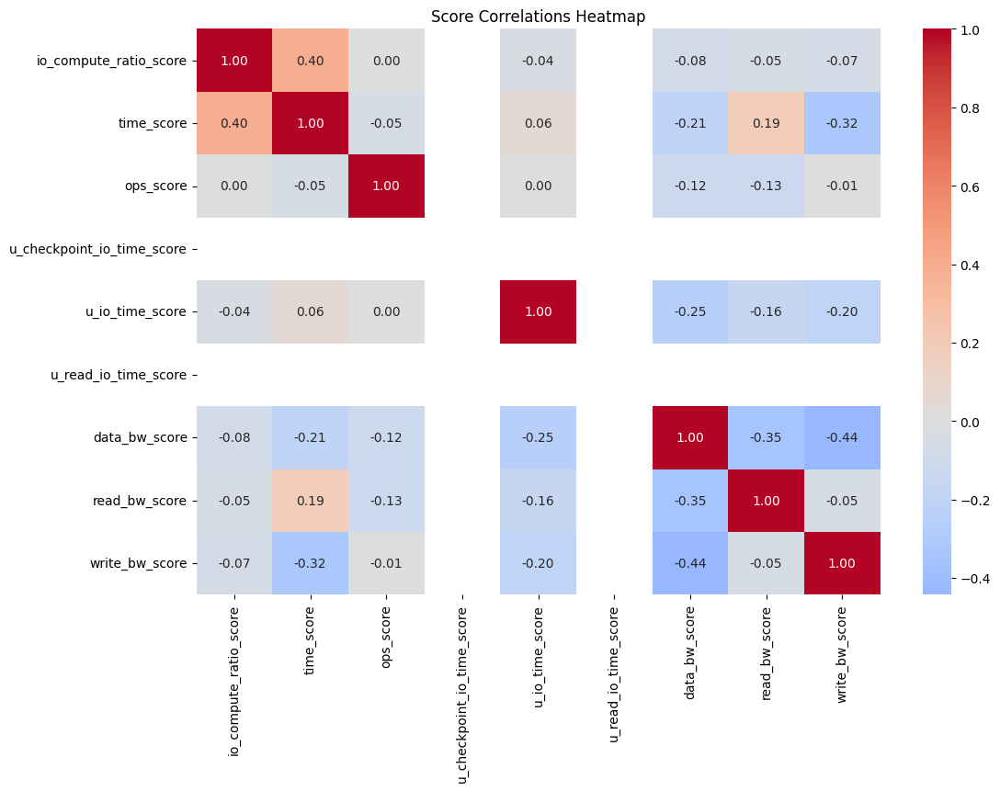

time: 662 ms (started: 2024-11-12 13:46:27 -08:00)


In [32]:
analyze_score_correlations(bottlenecks[score_cols].compute())